# Поиск изображений по описанию

**Цель работы**: разработать демонстрационную версию сервиса поиска изображений по запросу.

**Описание задачи**: хостингу для профессиональных фотографов «With Sense» требуется разработать модель, определяющую вероятность соответствия конкретных текстовых описаний и картинок  в рамках PoC. Данный сервис мог бы помочь фотографам в поиске референсных изображений.

**Описание данных**:
*   пары с именами файлов изображений и соответствующими описаниями (до 5 на одну картинку);
*   данные по соответствию изображения и описания, полученные с помощью краудсорсинга;
*   данные по соответствию изображения и описания, полученные в результате опроса экспертов;
*  изображения для обучения и тестирования модели.

**План проведения исследования**:
*   проведём исследовательский анализ данных;
*   подготовим данные к обучению с учётом юридических ограничений;
*   выполним векторизацию тектов и изображений;
*   выберес метрику оценки качества моделей;
*   обучим модели предсказания соответствия;
*   проверим результат работы лучшей модели на тестовых данных.

**Юридические ограничения:** поисковым сервисам запрещено без разрешения родителей или законных представителей предоставлять любую информацию, содержащую описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.

## Загрузка данных и библиотек

###  Импорт библиотек

Импортируем необходимые библиотеки:

In [ ]:
pip install optuna==3.6 optuna-integration keras-nlp tensorflow==2.17 stopwordsiso Pillow dask[dataframe] -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 379.9/379.9 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.9/96.9 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.1/644.1 kB 31.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.5/73.5 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.2/243.2 kB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 92.3 MB/s eta 0:00:00


In [ ]:
import gc
import os
import re
import sys
from pathlib import Path

import keras_nlp
from keras.applications.resnet50 import preprocess_input
import lightgbm as lgbm
import matplotlib.pyplot as plt
import missingno as msno
import nltk
from nltk.stem import WordNetLemmatizer
import numpy as np
import optuna
import pandas as pd
import seaborn as sns
from PIL import Image
from pylab import rcParams
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import (
    GroupShuffleSplit,
    cross_val_score,
    train_test_split,
)
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import LinearSVR
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import (
    BatchNormalization,
    Dense,
    Dropout,
    Flatten,
    GlobalAveragePooling2D,
)
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import notebook, tqdm
import stopwordsiso as stopwords
from optuna import create_study, Trial, distributions
from optuna.samplers import TPESampler
from sentence_transformers import SentenceTransformer, util
from warnings import simplefilter
import warnings
import glob

In [ ]:
# настройки Pandas
pd.options.display.float_format ='{:,.3f}'.format
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 512)

# seed для генераторов случайных чисел
SEED = 42

# прогресс-бар
tqdm.pandas()

# настройки графиков
PLOT_DPI = 150
sns.set_theme(style="darkgrid", palette="crest")
rcParams['figure.figsize'] = 12, 6
plt.rc(
       'axes',
       labelweight='bold',
       titlesize=16,
       titlepad=10,
      )

# остальные настройки
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
warnings.filterwarnings("ignore")

# путь к директориям
PATH_LOCAL_FOLDER="/Users/Documents/DS/Поиск изображений"
PATH_REMOTE_FOLDER="/content/drive/MyDrive/DS/Поиск изображений"

# словари слов
stopwords = stopwords.stopwords("en")
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

### Чтение данных

Напишем функцию чтения файлов из локальной и удалённой директории.

In [ ]:
# функция для чтения csv-файлов
def load_csv_dataset(
    FILENAME,
    SEPARATOR,
    has_header=True
):
    if os.path.exists(os.path.join(PATH_LOCAL_FOLDER, FILENAME)):
        return pd.read_csv(os.path.join(PATH_LOCAL_FOLDER, FILENAME), sep=SEPARATOR)
    elif os.path.exists(os.path.join(PATH_REMOTE_FOLDER, FILENAME)):
        return pd.read_csv(os.path.join(PATH_REMOTE_FOLDER, FILENAME), sep=SEPARATOR)
    else:
        print(
            f"Файл {FILENAME} не найден ни в локальной, ни в удаленной папке."
        )
        return None


# функция для чтения tsv-файлов
def load_tsv_dataset(
    FILENAME,
    has_header=True,
):
    if os.path.exists(os.path.join(PATH_LOCAL_FOLDER, FILENAME)):
        header_option = 0 if has_header else None
        return pd.read_csv(
            os.path.join(PATH_LOCAL_FOLDER, FILENAME), sep='\t', header=header_option
        )
    elif os.path.exists(os.path.join(PATH_REMOTE_FOLDER, FILENAME)):
        header_option = 0 if has_header else None
        return pd.read_csv(
            os.path.join(PATH_REMOTE_FOLDER, FILENAME), sep='\t', header=header_option
        )
    else:
        print(f"Файл {FILENAME} не найден ни в локальной, ни в удаленной папке.")
        return None

Считаем тренировочную выборку и сохраним в переменную `train_set`:

In [ ]:
# считаем данные
train_set = load_csv_dataset('train_dataset.csv', ',')

# проверим результат
train_set.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .


Считаем тестовые выборки и сохраним в переменные `test_queries` и `test_images`:

In [ ]:
# считаем данные
test_queries = load_csv_dataset('test_queries.csv', '|')

# проверим результат
test_queries.head()

,Unnamed: 0,query_id,query_text,image
0,0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg


In [ ]:
# считаем данные
test_images = load_tsv_dataset('test_images.csv', has_header=True)

# проверим результат
test_images.head()

,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


Считаем даные разметки изображений на краудсорсинге и сохраним в переменную `crowd_set`:

In [ ]:
# считаем данные
crowd_set = load_tsv_dataset('CrowdAnnotations.tsv', has_header=False)

# проверим результат
crowd_set.head()

,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000,0,3


Считаем даные разметки изображений экспертами и сохраним в переменную `expert_set`:

In [ ]:
# считаем данные
expert_set = load_tsv_dataset('ExpertAnnotations.tsv', has_header=False)

# проверим результат
expert_set.head()

,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


### Изучение данных

Изучим структуру и полноту полученных данных.

In [ ]:
def info_dataset(dataset):
    print(dataset.info())
    msno.bar(dataset)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
None


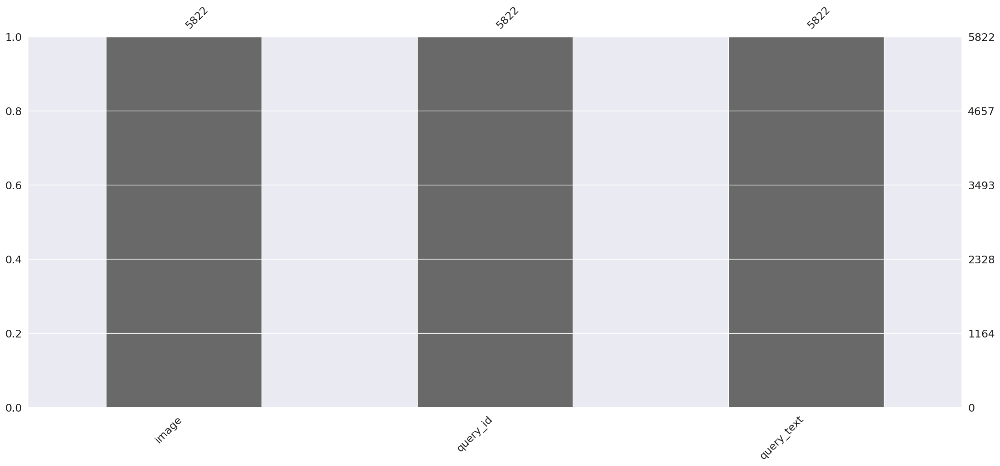

In [ ]:
info_dataset(train_set)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  500 non-null    int64 
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
 3   image       500 non-null    object
dtypes: int64(1), object(3)
memory usage: 15.8+ KB
None


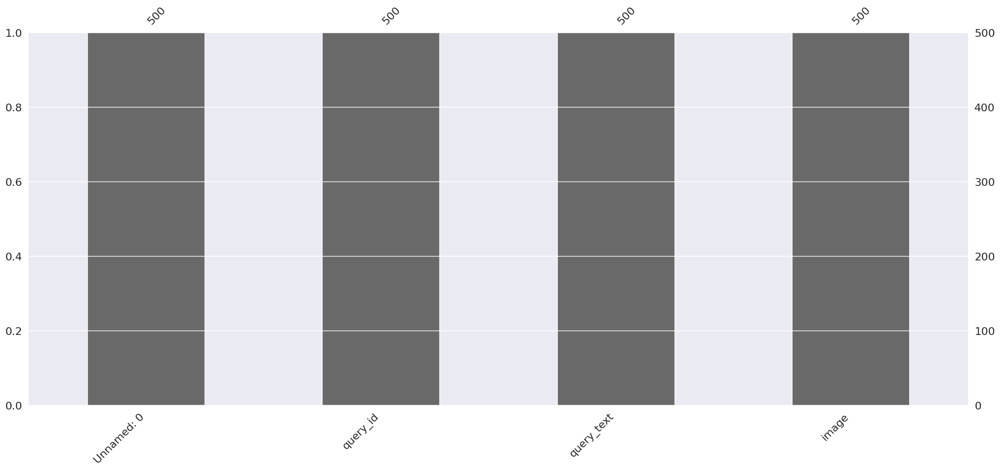

In [ ]:
info_dataset(test_queries)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes
None


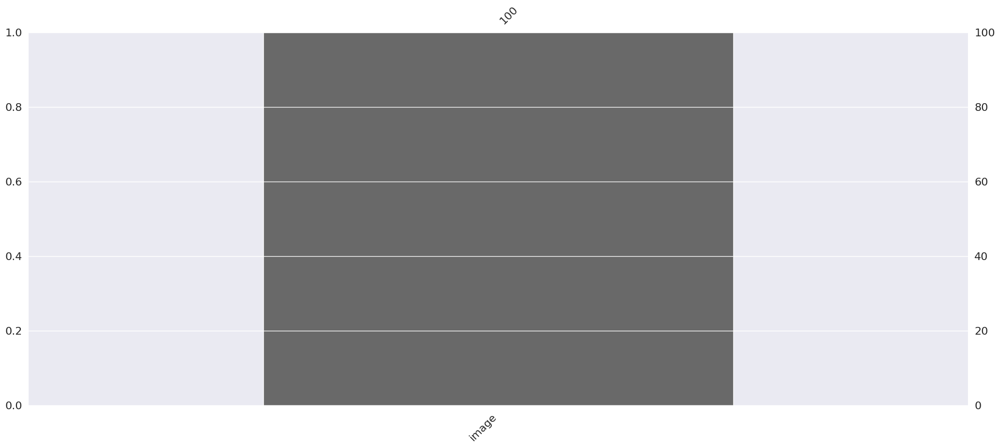

In [ ]:
info_dataset(test_images)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       47830 non-null  object 
 1   1       47830 non-null  object 
 2   2       47830 non-null  float64
 3   3       47830 non-null  int64  
 4   4       47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
None


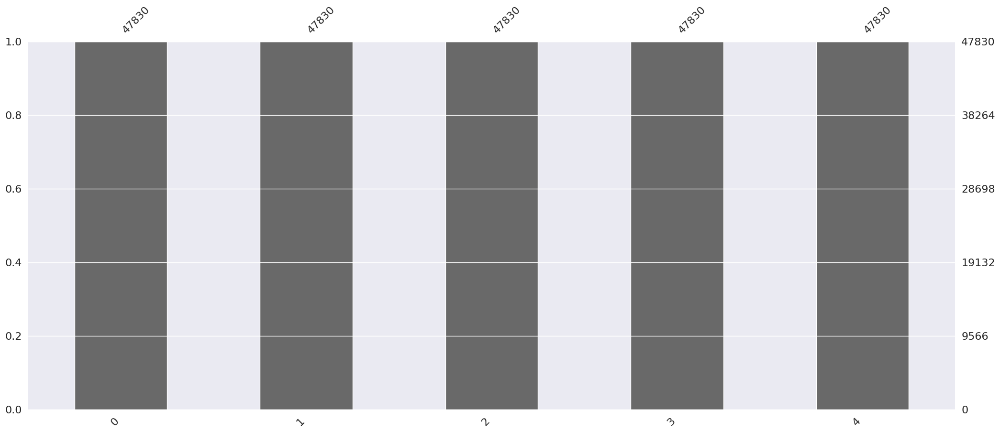

In [ ]:
info_dataset(crowd_set)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       5822 non-null   object
 1   1       5822 non-null   object
 2   2       5822 non-null   int64 
 3   3       5822 non-null   int64 
 4   4       5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB
None


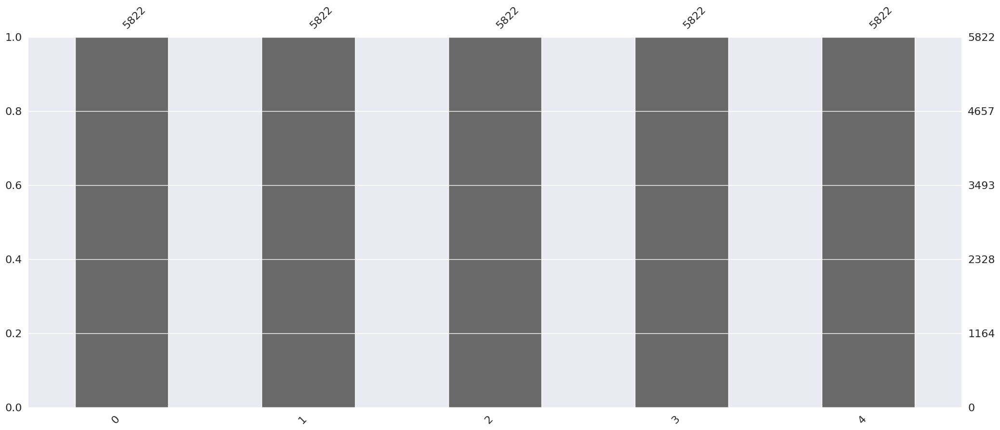

In [ ]:
info_dataset(expert_set)

**Вывод**
    
Для проведения исследования получены следующие данные:

**Датасет train_set** содержит информацию, необходимую для обучения:
* `image` — имя файла изображения;
* `query_id` — идентификатор описания в формате: <имя файла изображения>#<порядковый номер описания>;
* `query_text` —  текст описания (доступно до 5 описаний).

**Датасет test_queries** содержит информацию, необходимую для тестирования:
* `query_id` — идентификатор запроса;
* `query_text` —  текст запроса;
* `image` — релевантное изображение.

В датафрейме имеется неинформативный столбец `Unnamed: 0`,  который повторяет индекс.

**Датасет test_images** содержит изображения для тестирования моделей.

**Датасет crowd_set** содержит данные по соответствию изображения и его описания, полученные с помощью краудсорсинга:
* `0` — имя файла изображения;
* `1` — идентификатор описания;
* `2` — доля людей, подтвердивших, что описание соответствует изображению;
* `3` — количество человек, подтвердивших, что описание соответствует изображению;
* `4` — количество человек, подтвердивших, что описание не соответствует изображению.

Необходимо переименовать столбцы датафрейма соответствующим образом.

**Датасет expert_set** содержит данные по соответствию изображения и его описания, полученные в результате опроса экспертов:
* `0` — имя файла изображения;
* `1` — идентификатор описания;
* `2` `3` `4`— оценки трёх экспертов по шкале от 1 до 4:
  * **1** — изображение и запрос совершенно не соответствуют друг другу,
  * **2** — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует,
  * **3** — запрос и текст соответствуют с точностью до некоторых деталей,
  * **4** — запрос и текст соответствуют полностью.

Необходимо переименовать столбцы датафрейма соответствующим образом.

Пропуски в данных отсутствуют.

Предварительно можно утверждать, что данных достаточно для проведения исследования.

## Предобработка данных

Изучим подробнее полученные данные, для удобства создадим словарь с датафреймами.

In [ ]:
#  словарь с датафреймами
dataframes = {
    'train_set': train_set,
    'test_queries': test_queries,
    'test_images': test_images,
    'crowd_set': crowd_set,
    'expert_set': expert_set
}

### Именование столбцов


Добавим названия столбцам датафреймов `crowd_set` и `expert_set`.

In [ ]:
# именуем столбцы
crowd_set.columns = ['image', 'query_id', 'matching_ratio', 'matching_cnt', 'mismatching_cnt']

# проверим результат
crowd_set.head()

,image,query_id,matching_ratio,matching_cnt,mismatching_cnt
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.000,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.000,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.000,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.000,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.000,0,3


In [ ]:
# именуем столбцы
expert_set.columns = ['image', 'query_id', 'expert_1', 'expert_2', 'expert_3']

# проверим результат
expert_set.head()

,image,query_id,expert_1,expert_2,expert_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


**Вывод**

Столбцы датафреймов именованы корректно.

### Отбор признаков


Удалим неинформативный признак `Unnamed: 0` из датафрейма `test_queries`.

In [ ]:
# удалим столбец
test_queries.drop('Unnamed: 0', axis=1, inplace=True)

# проверим результат
test_queries.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg


**Вывод**

Неинформативные признаки исключены.

### Дубликаты
Проверим выборки на наличие явных дубликатов.

In [ ]:
def print_duplicate_counts(dataframes):
    for name, df in dataframes.items():
        duplicate_count = df.duplicated().sum()
        print(f'Количество дубликатов в датафрейме {name}: {duplicate_count}')

In [ ]:
print_duplicate_counts(dataframes)

Количество дубликатов в датафрейме train_set: 0
Количество дубликатов в датафрейме test_queries: 0
Количество дубликатов в датафрейме test_images: 0
Количество дубликатов в датафрейме crowd_set: 0
Количество дубликатов в датафрейме expert_set: 0


Дополнительно убедимся, что в оценочных датасетах отсутствуют дубликаты пар изображение - описание с разными оценками:

In [ ]:
print('Количество дубликатов пар изображение - описание в датафрейме expert_set:', expert_set[['image', 'query_id']].duplicated().sum())
print('Количество дубликатов пар изображение - описание в датафрейме crowd_set:', crowd_set[['image', 'query_id']].duplicated().sum())

Количество дубликатов пар изображение - описание в датафрейме expert_set: 0
Количество дубликатов пар изображение - описание в датафрейме crowd_set: 0


**Вывод**
    
Явные дубликаты отсутствуют.

### Уникальные значения

Проверим количество уникальных изображений в обучающей и тестовой выборках.

In [ ]:
print(
    'Количество уникальных изображений и запросов в тренировочной выборке:',
    f'{len(train_set["image"].unique())} — {len(train_set["query_text"].unique())}'
)
print('Количество объектов в тренировочной выборке:', train_set.shape[0])

Количество уникальных изображений и запросов в тренировочной выборке: 1000 — 977
Количество объектов в тренировочной выборке: 5822


In [ ]:
print(
    'Количество уникальных изображений и запросов в тестовой выборке:',
    f'{len(test_queries["image"].unique())} — {len(test_queries["query_text"].unique())}'
    )
print('Количество объектов в тестовой выборке:', test_queries.shape[0])

Количество уникальных изображений и запросов в тестовой выборке: 100 — 500
Количество объектов в тестовой выборке: 500


Проверим,  повторяются ли изображения и описания в обучающей и тестовой выборках.

In [ ]:
print('Совпадает текстовых описаний в обоих выборках:', len(set(train_set['query_text']) & set(test_queries['query_text'])))
print('Совпадает изображений в обоих выборках:', len(set(train_set['image']) & set(test_queries['image'])))

Совпадает текстовых описаний в обоих выборках: 0
Совпадает изображений в обоих выборках: 0


In [ ]:
print('Количество уникальных пар изображение-описание с оценкой экспертов:', expert_set.shape[0])
print('Количество уникальных пар изображение-описание с оценкой людьми:', crowd_set.shape[0])

Количество уникальных пар изображение-описание с оценкой экспертов: 5822
Количество уникальных пар изображение-описание с оценкой людьми: 47830


Визуально ознакомимся с парами изображение-описание.

A man at a rodeo is thrown off a horse .


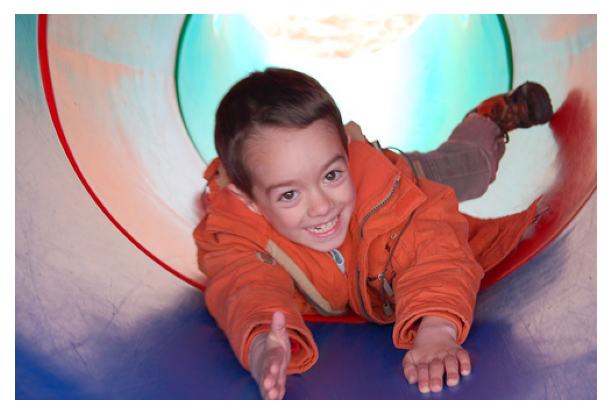



Hockey players with one taking a shot .


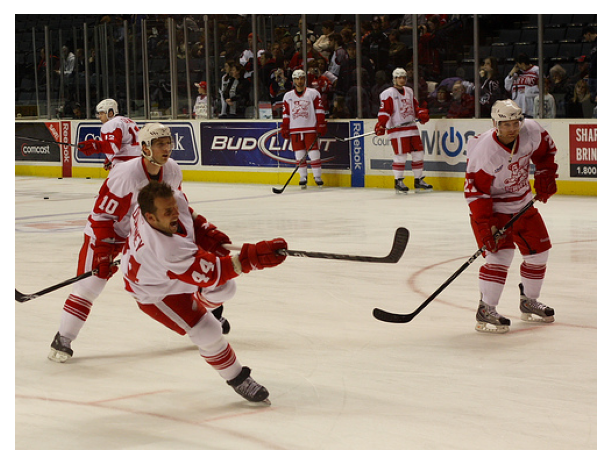



A skateboarder is skating down a very steep ramp in a skate park .


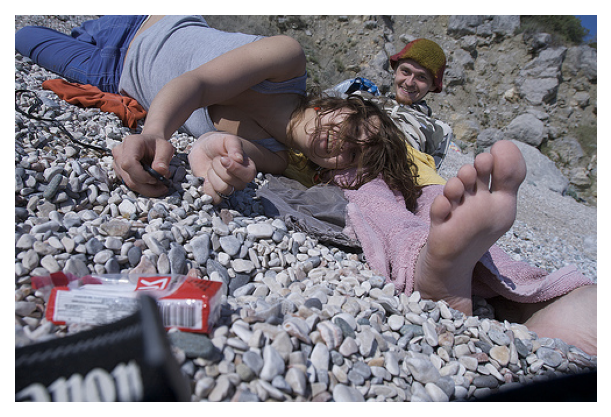



A little boy in a purple shirt and blue shorts playing with orange balls .


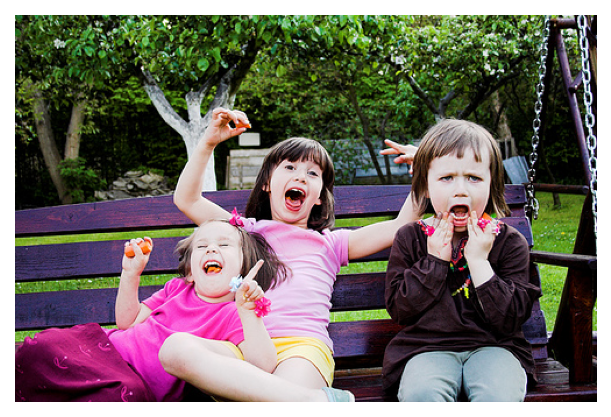



Dogs pulling a sled in a sled race .


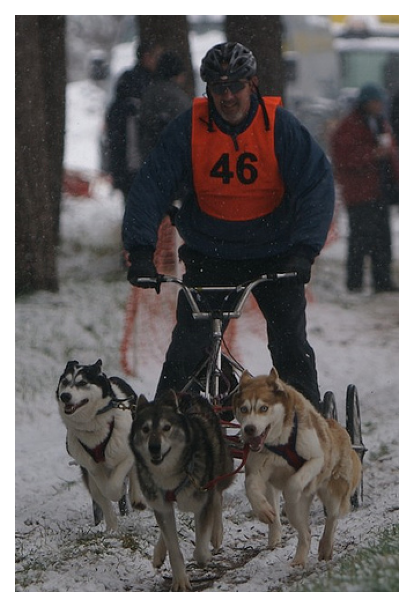

In [ ]:
for i, row in train_set.sample(5, random_state=SEED).iterrows():
    print(row.query_text)
    img_path = os.path.join(PATH_REMOTE_FOLDER, 'train_images', row.image)

    # откроем изображение
    img_data = np.array(Image.open(img_path))

    # отобразим изображение
    plt.figure(figsize=(5, 5), dpi=PLOT_DPI)
    plt.imshow(img_data)
    plt.axis('off')
    plt.show()

    print('\n')

**Вывод:**

Тренировочная выборка состоит из 5822 объектов, среди которых 977 уникальных запросов и 1000 уникальных изображений.

Похоже, что в тренировочную выборку попали только описания изображений с номером #2, при этом в тестовой выборке к каждому снимку доступно по 5 описаний.

Совпадений между наборами данных для тренировки и тестированя не выявлено.

Среди пар изображение-описание, оценённых как экспертами, так и людьми, отсутствуют дубликаты.



## Исследовательский анализ

Для проведения исследования доступны экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи необходимо агрегировать эти оценки.

Перед выбором способа агрегации изучим имеющиеся данные.

**Изучим краудсорсинговые оценки соответствия текста и изображения.**

In [ ]:
# выведем основные статистики
crowd_set.describe().T

,count,mean,std,min,25%,50%,75%,max
matching_ratio,"47,830.000",0.069,0.208,0.000,0.000,0.000,0.000,1.000
matching_cnt,"47,830.000",0.208,0.629,0.000,0.000,0.000,0.000,5.000
mismatching_cnt,"47,830.000",2.820,0.657,0.000,3.000,3.000,3.000,6.000


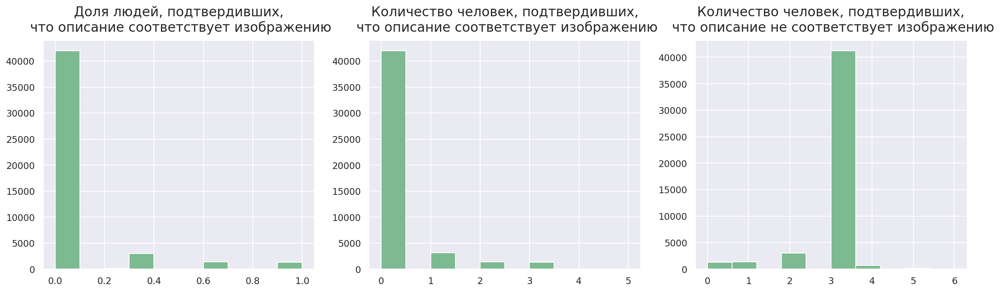

In [ ]:
# визуализация данных
fig, axes = plt.subplots(1, 3, figsize=(20, 5), dpi=PLOT_DPI)

crowd_set['matching_ratio'].hist(ax=axes[0])
axes[0].set_title("Доля людей, подтвердивших,\n что описание соответствует изображению")

crowd_set['matching_cnt'].hist(ax=axes[1])
axes[1].set_title("Количество человек, подтвердивших,\n что описание соответствует изображению")

crowd_set['mismatching_cnt'].hist(ax=axes[2])
axes[2].set_title("Количество человек, подтвердивших,\n что описание не соответствует изображению")

plt.show()

**Вывод:**

**Доля людей, подтвердивших,  что описание соответствует изображению**, имеет низкое среднее значение и большой разброс в значениях.

Большинство описаний не соответствуют изображениям по мнению респондентов.

**Количество человек, подтвердивших, что описание соответствует изображению**, также имеет низкое среднее и большой разброс значений.

Большинство соответствий не подтверждаются ни одним респондентом.
Соответствие описания изображению подтверждают максимально 5 респондентов.

**Количество человек, подтвердивших, что описание не соответствует изображению** имеет довольно высокое среднее значение и относительно низкий разброс.

В среднем, описание не соответствует изображениям у 3 респондентов.

Данные показывают, что большинство описаний не соответствуют изображениям по мнению опрошенных людей.

Это может быть вызвано следующими причинами:
* описание плохо сформулировано и респонденты его не понимают;
* изображения нечеткие и размытые из-за чего сложно оценить соответствие;
* описание слишком общее и подходит для многих изображений.

**Дополнительно изучим оценки экспертов.**

In [ ]:
# выведем основные статистики
expert_set.describe().T

,count,mean,std,min,25%,50%,75%,max
expert_1,"5,822.000",1.437,0.787,1.000,1.000,1.000,2.000,4.000
expert_2,"5,822.000",1.624,0.856,1.000,1.000,1.000,2.000,4.000
expert_3,"5,822.000",1.882,0.904,1.000,1.000,2.000,2.000,4.000


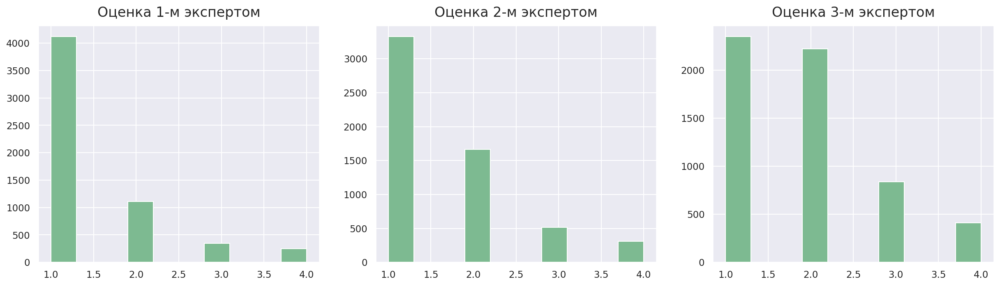

In [ ]:
# визуализация данных
fig, axes = plt.subplots(1, 3, figsize=(20, 5), dpi=PLOT_DPI)

expert_set['expert_1'].hist(ax=axes[0])
axes[0].set_title("Оценка 1-м экспертом")

expert_set['expert_2'].hist(ax=axes[1])
axes[1].set_title("Оценка 2-м экспертом")

expert_set['expert_3'].hist(ax=axes[2])
axes[2].set_title("Оценка 3-м экспертом")

plt.show()

**Вывод:**

Можно заключить, что эксперты чаще дают более высокие оценки соответствию описаний и изображений - средние значения для всех экспертов выше, чем для респондентов краудсорсинга.

Экспертные оценки более согласованы, чем оценки случайных пользователей, о чём говорит стандартное отклонение.

Оценки эксертов вызывают больше доверия, так как они обычно имеют более чёткое понимание критериев соответствия, а также более мотивированы на то, чтобы дать точную оценку, чем случайные пользователи.

При этом, количество экспертных оценок ограничено, поэтому для обучения модели будем использовать все имеющиеся оценки соответствия.

### Агрегация оценок

Изучим подробнее пересечения экспертных и краудсорсинговых оценок.

In [ ]:
# получим множества уникальных пар изображение-описание
expert_combinations = set(zip(expert_set['image'], expert_set['query_id']))
crowd_combinations = set(zip(crowd_set['image'], crowd_set['query_id']))

# получим пересечение
common_combinations = expert_combinations.intersection(crowd_combinations)

# проверим результат
print('Количество совпадающих комбинаций:', len(common_combinations))

Количество совпадающих комбинаций: 2329


In [ ]:
expert_combinations = set(zip(expert_set['image'], expert_set['query_id']))
train_combinations = set(zip(train_set['image'], train_set['query_id']))

print('Количество совпадающих комбинаций:', len(expert_combinations.intersection(train_combinations)
))

Количество совпадающих комбинаций: 5822


Только 2329 пар изображение-описание имеют оценки как людей, так и экспертов, а экспертную оценку имеют все изображения тренировочной выборки.

При этом оценки экспертов более репрезентативны и надёжны, в дальнейшем исследовании будем использовать именно оценку экспертов.

Получим усреднённую оценку экспертов:

In [ ]:
# Вычислим среднюю оценку
expert_set["combined_score"] = expert_set.loc[:, "expert_1":"expert_3"].apply(
    lambda x: np.average(x), axis=1
)

In [ ]:
# проверим результат
expert_set.sample(10, random_state=SEED)

,image,query_id,expert_1,expert_2,expert_3,combined_score
544,172097782_f0844ec317.jpg,3641022607_e7a5455d6c.jpg#2,3,4,4,3.667
1894,2621415349_ef1a7e73be.jpg,2675685200_0913d84d9b.jpg#2,1,1,2,1.333
5546,539751252_2bd88c456b.jpg,3564543247_05cdbc31cf.jpg#2,2,3,3,2.667
4923,3694093650_547259731e.jpg,2204550058_2707d92338.jpg#2,1,1,1,1.000
3624,3263395801_5e4cee2b9e.jpg,1554713437_61b64527dd.jpg#2,1,2,2,1.667
506,1659358141_0433c9bf99.jpg,2774430374_fee1d793e7.jpg#2,1,1,1,1.000
5106,405615014_03be7ef618.jpg,2666205903_8d287669e1.jpg#2,1,1,2,1.333
3805,3339140382_2e49bc324a.jpg,3123351642_3794f2f601.jpg#2,1,1,2,1.333
408,1490213660_9ea45550cf.jpg,3070011270_390e597783.jpg#2,2,2,3,2.333
4108,3437654963_c4fdc17e8b.jpg,197107117_4b438b1872.jpg#2,1,1,1,1.000


Итоговая взвешенная оценка успешно рассчитана и добавлена в датафрейм.

### Обучающая выборка

Дополним тренировочную выборку данными о комбинациях и итоговых оценках соответствия.

In [ ]:
# объединим датафреймы
train_set = pd.merge(
    train_set,
    expert_set[['image', 'query_id', 'combined_score']],
    on=['image', 'query_id']
    )

# проверим результат
display(
    train_set.sample(10, random_state=SEED),
    train_set.info()
    )

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           5822 non-null   object 
 1   query_id        5822 non-null   object 
 2   query_text      5822 non-null   object 
 3   combined_score  5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


,image,query_id,query_text,combined_score
544,542317719_ed4dd95dc2.jpg,3591458156_f1a9a33918.jpg#2,A man at a rodeo is thrown off a horse .,1.000
1894,3301811927_a2797339e5.jpg,3301811927_a2797339e5.jpg#2,Hockey players with one taking a shot .,4.000
5546,3516825206_5750824874.jpg,2944362789_aebbc22db4.jpg#2,A skateboarder is skating down a very steep ramp in a skate park .,1.000
4923,2498897831_0bbb5d5b51.jpg,3677318686_b018862bb7.jpg#2,A little boy in a purple shirt and blue shorts playing with orange balls .,1.000
3624,2358561039_e215a8d6cd.jpg,1287073593_f3d2a62455.jpg#2,Dogs pulling a sled in a sled race .,4.000
506,2285570521_05015cbf4b.jpg,2100816230_ff866fb352.jpg#2,A man jumps while snow skiing .,3.000
5106,2901880865_3fd7b66a45.jpg,2901880865_3fd7b66a45.jpg#2,A surfer is jumping a wave .,4.000
3805,2105756457_a100d8434e.jpg,2608289957_044849f73e.jpg#2,"Boy in pajamas , with red and yellow toy , seated on tire near plants .",1.333
408,2813992915_f732cf8539.jpg,3549583146_3e8bb2f7e9.jpg#2,A young boy is riding a bike .,3.000
4108,2932740428_b15384f389.jpg,2891617125_f939f604c7.jpg#2,A person on a dirt bike is riding up a sandy hill .,3.333


None

Тренировочная выборка успешно сформирована, выделен целевой признак.

### Визуализация таргета

Изучим распределение целевого признака.

In [ ]:
def visuals(target):
    display(train_set[target].describe())

    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,6), dpi=PLOT_DPI)

    train_set[target].plot(kind='hist', bins=20, ax=axes[0])
    axes[0].set_title('Гистограмма распределения', fontsize=14)
    axes[0].set_ylabel('Частота встречаемости')
    axes[0].set_xlabel('Наблюдаемые значения')

    train_set[target].plot(kind='box', ax=axes[1], rot=0)
    axes[1].set_title('Разброс значений признаков', fontsize=14)
    axes[1].set_xlabel('Категория')
    axes[1].set_ylabel('Наблюдаемые значения')

,combined_score
count,"5,822.000"
mean,1.648
std,0.806
min,1.000
25%,1.000
50%,1.333
75%,2.000
max,4.000


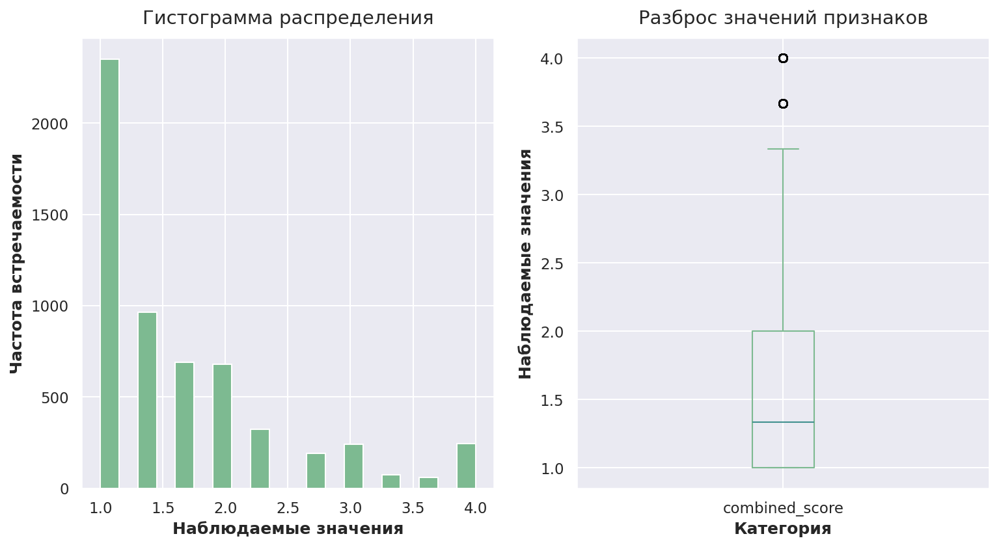

In [ ]:
visuals('combined_score')

**Вывод:**

Большинство оценок сосредоточены в нижней части диапазона, что говорит о преобладании случаев несоответствия между изображением и описанием.

Интересно, что количество полностью подходящих пар (оценка близка к 1) выше, чем у остальных оценок выше 0.5. Это может говорить о том, что есть некоторое количество пар идеального совпадения изображение-описание.

Такое распределение целевой переменной может затруднить обучение модели, так как примеров идеального совпадения намного меньше, чем экземпляров полного несоответствия.

## Проверка данных

В данном шаге исследования учтём юридические ограничения и исключим из обучающей выборки все изображения, нарушающие законодательство.

Поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.


Для избавления от нелегального контента воспользуемся текстовыми описаниями файлов:
* объявим список слов для поиска запрещённых изображений;
* очистим, токенизируем и лемматизируем текст, чтобы было легче искать запрещённые запросы;
* отметим в обучающем наборе изображения, подлежащие блокировке.

###  Очистка данных
Выполним очистку и лемматизацию текста.

In [ ]:
# создадим экземпляр WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

def clean_text(text):
    # приведём текст к нижнему регистру
    text = text.lower()

    # удалим неалфавитно-цифровые символы
    text = re.sub(r'[^a-zA-Z\s]', '', text)

    # токенизируем слова
    text = nltk.word_tokenize(text, language = 'english')

    # выполним лемматизацию
    # text = [lemmatizer.lemmatize(word) for word in text]

    return text

In [ ]:
# очистим данные, результат сохраним в отдельном столбце
train_set['clean_text'] = train_set['query_text'].apply(clean_text)

# проверим результат
train_set.sample(5, random_state=SEED)

,image,query_id,query_text,combined_score,clean_text
544,542317719_ed4dd95dc2.jpg,3591458156_f1a9a33918.jpg#2,A man at a rodeo is thrown off a horse .,1.000,"[a, man, at, a, rodeo, is, thrown, off, a, horse]"
1894,3301811927_a2797339e5.jpg,3301811927_a2797339e5.jpg#2,Hockey players with one taking a shot .,4.000,"[hockey, players, with, one, taking, a, shot]"
5546,3516825206_5750824874.jpg,2944362789_aebbc22db4.jpg#2,A skateboarder is skating down a very steep ramp in a skate park .,1.000,"[a, skateboarder, is, skating, down, a, very, steep, ramp, in, a, skate, park]"
4923,2498897831_0bbb5d5b51.jpg,3677318686_b018862bb7.jpg#2,A little boy in a purple shirt and blue shorts playing with orange balls .,1.000,"[a, little, boy, in, a, purple, shirt, and, blue, shorts, playing, with, orange, balls]"
3624,2358561039_e215a8d6cd.jpg,1287073593_f3d2a62455.jpg#2,Dogs pulling a sled in a sled race .,4.000,"[dogs, pulling, a, sled, in, a, sled, race]"


Данные успешно очищены, в результате обработки выполнены преобразования:

* текст приведён к нижнему регистру;
* удалены неалфавитно-цифровые символы;
* выполнена токенизация и лемматизация.

###  Поиск запрещённого контента
Сформируем список слов, определяющий изображение детей в наборе данных.

Удалим записи тренировочной выборки, содержащие в описании слова, относящихся к детям.

In [ ]:
# слова, определяющие изображение детей
stop_list = [
    "boy",
    "boys",
    "girl",
    "girls",
    "child",
    "children",
    "young",
    "youth",
    "youths",
    "baby",
    "babies",
    "teenage",
    "teenager",
    "teenagers",
    "kid",
    "kids",
    "toddler",
    "toddlers"
]

In [ ]:
# функция для поиска слов, относящихся к детям
def search_child(x):
    if any(i in x for i in stop_list): return 1
    return 0

In [ ]:
# применим функцию
train_set['to_block'] = train_set['clean_text'].apply(search_child)

# проверим результат
train_set.sample(5, random_state=SEED)

,image,query_id,query_text,combined_score,clean_text,to_block
544,542317719_ed4dd95dc2.jpg,3591458156_f1a9a33918.jpg#2,A man at a rodeo is thrown off a horse .,1.000,"[a, man, at, a, rodeo, is, thrown, off, a, horse]",0
1894,3301811927_a2797339e5.jpg,3301811927_a2797339e5.jpg#2,Hockey players with one taking a shot .,4.000,"[hockey, players, with, one, taking, a, shot]",0
5546,3516825206_5750824874.jpg,2944362789_aebbc22db4.jpg#2,A skateboarder is skating down a very steep ramp in a skate park .,1.000,"[a, skateboarder, is, skating, down, a, very, steep, ramp, in, a, skate, park]",0
4923,2498897831_0bbb5d5b51.jpg,3677318686_b018862bb7.jpg#2,A little boy in a purple shirt and blue shorts playing with orange balls .,1.000,"[a, little, boy, in, a, purple, shirt, and, blue, shorts, playing, with, orange, balls]",1
3624,2358561039_e215a8d6cd.jpg,1287073593_f3d2a62455.jpg#2,Dogs pulling a sled in a sled race .,4.000,"[dogs, pulling, a, sled, in, a, sled, race]",0


In [ ]:
print(train_set[train_set['to_block'] == 1]['query_text'].sample(10).unique())

['A young girl is wearing a purple shirt and pink headband .'
 'A young boy wearing a blue and red hat is using a camera near a swing set .'
 'A girl with a bucket of water is being chased by a boy with a bucket of water .'
 'Two redheaded boys in brown shirts stand on a table and are fighting with sticks .'
 'The room full of youths reacts emotionally as they spectate .'
 'A blonde baby playing in the sand .'
 'Two boys are walking inside a human-size exercise-wheel .'
 'Five young men pose on the steps .'
 'The young adults take a group shot of themselves .'
 'The baby in suspenders sits by a toy .']


Записи в тренировочной выборке размечены с помощью стоп-листа, получим названия неподходящих изображений.

In [ ]:
train_copy = train_set.copy()

# создание маски для удаления и получение названия изображения
mask = train_set['to_block'] == 1
query_ids = train_set.loc[mask, 'query_id'].str.replace(r'#\d+$', '', regex=True)

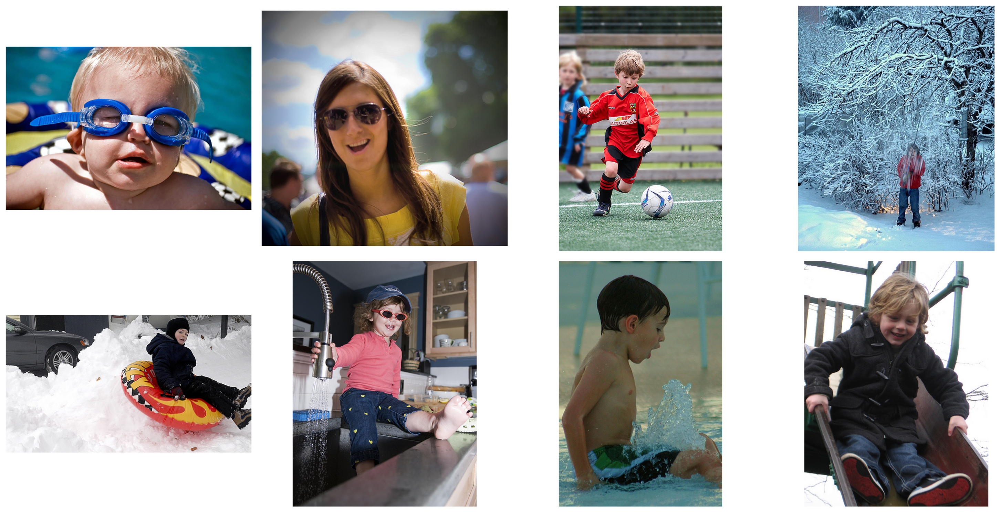

In [ ]:
# ознакомимся с отобранными изображениями
sample=query_ids.unique()

fig = plt.figure(figsize=(20,20), dpi=PLOT_DPI)
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH_REMOTE_FOLDER, 'train_images', sample[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

In [ ]:
# исключим изображения, попадающие под юридические ограничения
train_set = train_set[~train_set['image'].isin(query_ids)]

#  сбросим индексы после удаления части данных
train_set.reset_index(drop=True, inplace=True)

In [ ]:
# проверим результат
print(
    'Размерность данных после изменений: ',
    train_set.shape
    )

print(f'Удалено {len(train_copy)-len(train_set)} записи, попадающие под ограничения')

train_set.sample(5, random_state=SEED)

Размерность данных после изменений:  (3998, 6)
Удалено 1824 записи, попадающие под ограничения


,image,query_id,query_text,combined_score,clean_text,to_block
1760,150387174_24825cf871.jpg,150387174_24825cf871.jpg#2,A man is riding a dirt bike over some rocks .,4.000,"[a, man, is, riding, a, dirt, bike, over, some, rocks]",0
3326,2431832075_00aa1a4457.jpg,2239938351_43c73c887c.jpg#2,"Three dogs , one of whom has a blue ball .",1.000,"[three, dogs, one, of, whom, has, a, blue, ball]",0
1770,219070971_ae43410b9e.jpg,219070971_ae43410b9e.jpg#2,A man in red pushes his motocross bike up a rock .,4.000,"[a, man, in, red, pushes, his, motocross, bike, up, a, rock]",0
3176,2308978137_bfe776d541.jpg,350443876_c9769f5734.jpg#2,A person on a ladder with a baby underneath .,1.333,"[a, person, on, a, ladder, with, a, baby, underneath]",1
2099,172097782_f0844ec317.jpg,241031254_0c6f30e3d1.jpg#2,A man wearing a water pack and shorts on an outdoor trail .,1.667,"[a, man, wearing, a, water, pack, and, shorts, on, an, outdoor, trail]",0


**Вывод:**

Юридические ограничения соблюдены: из тренировочной выборки исключены 1783 изображения, которые нарушают требования законодательства.

## Векторизация изображений

Для получения векторов изображений использованием модель `ResNet50`, предварительно обученную на датасете `ImageNet`.

In [ ]:
# подготовим загрузчик данных с паддингом
def load_train(path=PATH_REMOTE_FOLDER) -> ImageDataGenerator:
    train_datagen = ImageDataGenerator(
        preprocessing_function=preprocess_input,
        fill_mode='constant',  # добавим паддинг
        cval=0
    )

    # создадим генератор данных с сохранением пропорций
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=train_set,
        directory=Path(path, 'train_images'),
        x_col='image',
        y_col='score',
        target_size=(224, 224),  # размер, на котором обучалась ResNet
        batch_size=16,
        class_mode='input',
        seed=SEED,
        shuffle=False  # порядок изображений сохранён
    )

    return train_gen_flow

In [ ]:
# зададим архитектуру сети
def create_model(input_shape=(224, 224, 3)):

    backbone = ResNet50(input_shape=input_shape,
                        weights='imagenet',
                        include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    optimizer = Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mean_absolute_error'])

    return model

In [ ]:
# получим эмбеддинги изображений
def vectorize_pictures(model, train_data):

    pict_embeds = model.predict(train_data)

    return pict_embeds

In [ ]:
train_image_embeddings = vectorize_pictures(create_model(), load_train())

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Found 3998 validated image filenames.
250/250 ━━━━━━━━━━━━━━━━━━━━ 229s 897ms/step


In [ ]:
print(
    'Размерность исходных данных: ',
    train_set.shape,
    '\n',
    'Размерность эмбеддингов изображений: ',
    train_image_embeddings.shape
    )

Размерность исходных данных:  (3998, 6) 
 Размерность эмбеддингов изображений:  (3998, 2048)


In [ ]:
# сохраним эмбеддинги
np.save(os.path.join(PATH_REMOTE_FOLDER, 'train_image_embeddings.npy'), train_image_embeddings)

**Вывод:**

Изображения тренировочной выборки успешно векторизированы.

## Векторизация текстов

Следующий этап — векторизация текстов. Для векторизации тектов применим трансформер `BERT` из библиоетки Keras-NLP.


**Паддинг данных**

In [ ]:
# загрузим трансформер BERT
BERT = keras_nlp.models.BertBackbone.from_preset('bert_base_en')
# загрузим preprocessor
preprocessor = keras_nlp.models.BertPreprocessor.from_preset('bert_base_en')

100%|██████████| 510/510 [00:00<00:00, 1.17MB/s]


100%|██████████| 414M/414M [00:13<00:00, 32.4MB/s]


100%|██████████| 548/548 [00:00<00:00, 579kB/s]


100%|██████████| 208k/208k [00:00<00:00, 959kB/s]


In [ ]:
#  преобразуем описания в словарь токенов, масок и паддингов
def vectorize_text(model, data, preprocessor=preprocessor, batch_size=32, bar=True, verbose=0) -> np.array:

    # Токенизация текста
    tokenized = preprocessor(data)

    # Проверка на пустые данные
    if tokenized['token_ids'].shape[0] == 0:
        raise ValueError("Входные данные пусты. Проверьте данные перед токенизацией.")

    embeddings = []

    # Определяем количество батчей
    num_batches = (tokenized['token_ids'].shape[0] + batch_size - 1) // batch_size  # Округляем вверх

    # Обработка данных по батчам
    for i in (notebook.tqdm(range(num_batches), disable=not bar)):
        start_index = batch_size * i
        end_index = min(start_index + batch_size, tokenized['token_ids'].shape[0])

        tokens = tokenized['token_ids'][start_index:end_index]
        token_types = tokenized['segment_ids'][start_index:end_index]
        mask = tokenized['padding_mask'][start_index:end_index]

        batch = {
            'token_ids': tokens,
            'segment_ids': token_types,
            'padding_mask': mask
        }

        batch_embeddings = model.predict(batch, verbose=verbose)
        embeddings.append(batch_embeddings['pooled_output'])

    return np.concatenate(embeddings)

In [ ]:
train_text_embeddings = vectorize_text(BERT, train_set['query_text'].tolist())

  0%|          | 0/125 [00:00<?, ?it/s]

In [ ]:
print(
    'Размерность исходных данных: ',
    train_set.shape,
    '\n',
    'Размерность текстовых эмбеддингов: ',
    train_text_embeddings.shape
    )

Размерность исходных данных:  (3998, 6) 
 Размерность текстовых эмбеддингов:  (3998, 768)


In [ ]:
# сохраним эмбеддинги
np.save(os.path.join(PATH_REMOTE_FOLDER, 'train_text_embeddings.npy'), train_text_embeddings)

**Вывод:**

Эмбеддинги тектового описания успешно получены.

##  Формирование выборок

Подготовим данные для обучения: разделим данные на обучающую и тестовую выборки с учётом того, что необходимо исключить попадание изображения и в обучающую, и в тестовую выборки.

Предварительно объединим векторы признаков.

In [ ]:
# загрузим эмбеддинги
train_image_embeddings = np.load(os.path.join(PATH_REMOTE_FOLDER, 'train_image_embeddings.npy'))
train_text_embeddings = np.load(os.path.join(PATH_REMOTE_FOLDER, 'train_text_embeddings.npy'))

In [ ]:
# проверим результат
print(
    'Размерность эмбеддингов изображений: ',
    train_image_embeddings.shape,
    '\n',
    'Размерность текстовых эмбеддингов: ',
    train_text_embeddings.shape
    )

Размерность эмбеддингов изображений:  (3998, 2048) 
 Размерность текстовых эмбеддингов:  (3998, 768)


In [ ]:
# объединим векторы признаков
X = np.concatenate((train_image_embeddings, train_text_embeddings), axis=1)

# проверим размерность объединенного массива
print('Размерность объединенных эмбеддингов: ', X.shape)

Размерность объединенных эмбеддингов:  (3998, 2816)


Определим целевой признак:

In [ ]:
y = np.array(train_set['combined_score'])

# проверим размерность объединенного массива
print('Размерность таргета : ', y.shape)

Размерность таргета :  (3998,)


Признаковое описание и таргет определены, разделим полученные данные на выборки.

In [ ]:
# разделим данные на обучающую и тестовую выборки
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=SEED)

train_indices, valid_indices = next(gss.split(X=X, y=y, groups=train_set["image"]))

In [ ]:
# получим обучающую и тестовую выборки
X_train, y_train = X[train_indices], y[train_indices]
X_valid, y_valid = X[valid_indices], y[valid_indices]

In [ ]:
# проверим результат
print(
    'Размеры тренировочных  выборок: ',
    X_train.shape,
    y_train.shape,
    '\n',
    'Размеры  тестовых выборок: ',
    X_valid.shape,
    y_valid.shape,
    '\n',
    'Количество одинаковых изображений в выборках: ',
    train_set.image[train_indices].isin(train_set.image[valid_indices]).sum(),
    sep=''
    )

Размеры тренировочных  выборок: (3190, 2816)(3190,)
Размеры  тестовых выборок: (808, 2816)(808,)
Количество одинаковых изображений в выборках: 0


Дополнительно нормализуем значения и приведём все оценки к диапазону от 0 до 1.

In [ ]:
# объявим скейлер
scaler = MinMaxScaler()

# масштабируем признаки
X_train_scaled = scaler.fit_transform(X_train)
X_valid_scaled= scaler.transform(X_valid)

In [ ]:
# дополнительно масштабируем таргет
scaler_y = MinMaxScaler()

y_train = scaler_y.fit_transform(y_train.reshape(-1, 1))
y_valid= scaler_y.transform(y_valid.reshape(-1, 1))

Обучение моделей проведём как на оригинальной, так и на масштабированной выборках.

##  Обучение моделей

В данном шаге исследования проведем сравнительный анализ трёх моделей, обученных на следующих алгоритмах:


*   Ridge;
*   LinearSVR;
*   нейронная сеть.

Качество модели оценим с помощью метрики `RMSE`, так как данная метрика чувствительна к большим ошибкам и хорошо интерпретируется.

---

### `Ridge`

Напишем пайплайн для обучения модели ридж-регрессии с подбором гиперпараметров.

In [ ]:
# напишем функцию для подбора гиперпараметров с помощью Optuna
def objective_ridge(trial):

    # укажем гиперпараметры модели для перебора
    params_ridge = {
        "alpha": trial.suggest_float("alpha", 1e-5, 1e2, log=True),
        "random_state": SEED
        }

    # создадим модель с гиперпараметрами
    model_ridge = Ridge(**params_ridge)

    # обучим модель
    model_ridge.fit(X_train, y_train)

    # получим предсказание на валидационной выборке
    y_pred_ridge = model_ridge.predict(X_valid)

    # получим метрику модели
    rmse_ridge = mean_squared_error(y_valid, y_pred_ridge, squared=False)

    return rmse_ridge

In [ ]:
# создадим объект study
study_ridge = optuna.create_study(direction="minimize", sampler=optuna.samplers.TPESampler(seed=10))

# запустим процесс оптимизации
study_ridge.optimize(objective_ridge, n_trials=30)

[I 2024-11-08 03:49:41,218] A new study created in memory with name: no-name-d7f91cbd-8014-4dc9-b55b-779634702e93
[I 2024-11-08 03:49:41,964] Trial 0 finished with value: 0.29059178016096965 and parameters: {'alpha': 2.5075205613534375}. Best is trial 0 with value: 0.29059178016096965.
[I 2024-11-08 03:50:04,256] Trial 1 finished with value: 0.30371613204748904 and parameters: {'alpha': 1.3972163064923956e-05}. Best is trial 0 with value: 0.29059178016096965.
[I 2024-11-08 03:50:04,892] Trial 2 finished with value: 0.29021424394790973 and parameters: {'alpha': 0.27260740237688313}. Best is trial 2 with value: 0.29021424394790973.
[I 2024-11-08 03:50:05,839] Trial 3 finished with value: 0.290473608505701 and parameters: {'alpha': 1.7443240864272584}. Best is trial 2 with value: 0.29021424394790973.
[I 2024-11-08 03:50:06,899] Trial 4 finished with value: 0.29521897563490535 and parameters: {'alpha': 0.03087088544037578}. Best is trial 2 with value: 0.29021424394790973.
[I 2024-11-08 03:

In [ ]:
# получим лучшие параметры модели
best_params_ridge = study_ridge.best_params

# создадим модель
tuned_model_ridge = Ridge(**best_params_ridge, random_state=SEED)

# обучим модель на масштабированных данных
tuned_model_ridge.fit(X_train_scaled, y_train)

# получим предсказания на валидационной выборке
preds = tuned_model_ridge.predict(X_valid_scaled)

In [ ]:
scores_ridge = study_ridge.best_value
scores_ridge_scaled = mean_squared_error(y_valid, preds, squared=False)

# выведем метрику лучшей модели
print('RMSE на валидационной выборке:')
print(scores_ridge)

print('RMSE на валидационной выборке с масштабированием:')
scores_ridge_scaled

RMSE на валидационной выборке:
0.28835224498453876
RMSE на валидационной выборке с масштабированием:


0.2656779444758921

**Вывод**
    
Получены лучшие параметры модели `Ridge()`.

- RMSE на валидационной выборке: **0.871**
- RMSE на валидационной выборке с масштабированием:  **0.796**

### LinearSVR

Напишем модель `LinearSVR()` с подбором гиперпараметров.

In [ ]:
# напишем функцию для подбора гиперпараметров с помощью Optuna
def objective_SVR(trial):
    # укажем гиперпараметры для перебора
    params_SVR = {
        "C": trial.suggest_float("C", 0.01, 1000),
        "epsilon": trial.suggest_float("epsilon", 0, 1),
        "max_iter": trial.suggest_int("max_iter", 100, 1000),
        "tol": trial.suggest_float("tol", 1e-5, 1e-1),
        "random_state": SEED
    }

    # создадим pipeline
    model_SVR = LinearSVR(**params_SVR)

    # обучим модель
    model_SVR.fit(X_train, y_train)

    # получим предсказание на валидационной выборке
    y_pred_SVR = model_SVR.predict(X_valid)

    # получим метрику модели
    rmse_SVR = mean_squared_error(y_valid, y_pred_SVR, squared=False)

    return rmse_SVR

In [ ]:
# создадим объект study
study_SVR = optuna.create_study(direction="minimize", sampler=optuna.samplers.TPESampler(seed=10))

# запустим процесс оптимизации
study_SVR.optimize(objective_SVR, n_trials=30)

[I 2024-11-08 03:52:35,378] A new study created in memory with name: no-name-8b269a9a-5859-4785-813c-d4939e687e18
[I 2024-11-08 03:52:57,598] Trial 0 finished with value: 0.30676031664978 and parameters: {'C': 771.3229300603133, 'epsilon': 0.0207519493594015, 'max_iter': 670, 'tol': 0.0748829002150358}. Best is trial 0 with value: 0.30676031664978.
[I 2024-11-08 03:53:03,465] Trial 1 finished with value: 0.2888611577435308 and parameters: {'C': 498.5120272324674, 'epsilon': 0.22479664553084766, 'max_iter': 278, 'tol': 0.07605546591277389}. Best is trial 1 with value: 0.2888611577435308.
[I 2024-11-08 03:53:22,948] Trial 2 finished with value: 0.3295827242964345 and parameters: {'C': 169.11914545416982, 'epsilon': 0.08833981417401027, 'max_iter': 717, 'tol': 0.0953398006860317}. Best is trial 1 with value: 0.2888611577435308.
[I 2024-11-08 03:53:23,374] Trial 3 finished with value: 0.376766410347706 and parameters: {'C': 3.958226845251172, 'epsilon': 0.5121922633857766, 'max_iter': 832,

In [ ]:
# получим лучшие параметры модели
best_params_SVR = study_SVR.best_params

# создадим модель
tuned_model_SVR = LinearSVR(**best_params_SVR, random_state=SEED)

# обучим модель на масштабированных данных
tuned_model_SVR.fit(X_train_scaled, y_train)

# получим предсказания на валидационной выборке
preds = tuned_model_SVR.predict(X_valid_scaled)

In [ ]:
scores_SVR = study_SVR.best_value
scores_SVR_scaled = mean_squared_error(y_valid, preds, squared=False)

# выведем метрики лучшей модели
print('RMSE на валидационной выборке:')
print(scores_SVR)

print('RMSE на валидационной выборке с масштабированием:')
scores_SVR_scaled

RMSE на валидационной выборке:
0.27626104337708735
RMSE на валидационной выборке с масштабированием:


0.2772850807541698

**Вывод**
    
Получены лучшие параметры модели `LinearSVR()`.

- RMSE на валидационной выборке: **0.**
- RMSE на валидационной выборке с масштабированием:  **0.796**

### NeuralNetwork

Напишем нейронную сеть на основе Keras.

In [ ]:
# определим архитектуру сети
def create_model_nn(n_hidden_neurons_1, n_hidden_neurons_2, dropout_rate):
    model = tf.keras.Sequential()

    model.add(tf.keras.layers.Input(shape=(X_train.shape[1],)))
    model.add(tf.keras.layers.Dense(n_hidden_neurons_1, activation='elu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(dropout_rate))

    model.add(tf.keras.layers.Dense(n_hidden_neurons_2, activation='elu'))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dropout(dropout_rate))

    model.add(tf.keras.layers.Dense(1, activation='linear'))

    return model

In [ ]:
# функция для подбора гиперпараметров с использованием Optuna
def objective_nn(trial):
    # Подбор гиперпараметров
    n_hidden_neurons_1 = trial.suggest_int('n_hidden_neurons_1', 128, 2048)
    n_hidden_neurons_2 = trial.suggest_int('n_hidden_neurons_2', 64, 1024)
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.2)
    learning_rate = trial.suggest_float('learning_rate', 1e-2, 0.01, log=True)

    # создаем модель
    model = create_model_nn(n_hidden_neurons_1, n_hidden_neurons_2, dropout_rate)

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=[tf.keras.metrics.RootMeanSquaredError()])

    # обучаем модель
    history = model.fit(
        X_train, y_train,
        validation_data=(X_valid, y_valid),
        batch_size=512,
        epochs=2000,
        verbose=2,
        callbacks=[
            tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True),
            tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=30, verbose=1)
        ]
    )

    # сохраним метрики для визуализации
    train_rmse = history.history['root_mean_squared_error']
    val_rmse = history.history['val_root_mean_squared_error']
    epochs = range(1, len(train_rmse) + 1)

    # сохраним history для визуализации
    plot_training_history(train_rmse, val_rmse, epochs, history)

    # оценим модель
    val_rmse = model.evaluate(X_valid, y_valid, verbose=1)[1]

    # освободим память
    tf.keras.backend.clear_session()
    gc.collect()

    return val_rmse

# функция для визуализации процесса обучения
def plot_training_history(train_rmse, val_rmse, epochs, history):
    plt.figure(figsize=(14, 6))

    # Train RMSE и Valid RMSE
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_rmse, label='Train RMSE', color='steelblue')
    plt.plot(epochs, val_rmse, label='Valid RMSE')
    plt.xlabel('Epochs')
    plt.ylabel('RMSE')
    plt.legend()
    plt.title('RMSE over Epochs')

    # Loss для обучения и валидации
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history.history['loss'], label='Train Loss', color='steelblue')
    plt.plot(epochs, history.history['val_loss'], label='Valid Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss over Epochs')

    plt.show()

[I 2024-11-08 03:54:13,484] A new study created in memory with name: no-name-a0388475-afe9-4c05-8b33-14fa3403cf1e


Epoch 1/2000
7/7 - 9s - 1s/step - loss: 16.9571 - root_mean_squared_error: 4.1179 - val_loss: 2548.4167 - val_root_mean_squared_error: 50.4818 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 3s - 444ms/step - loss: 0.8813 - root_mean_squared_error: 0.9388 - val_loss: 1515.2699 - val_root_mean_squared_error: 38.9265 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 41ms/step - loss: 0.7416 - root_mean_squared_error: 0.8612 - val_loss: 69.8439 - val_root_mean_squared_error: 8.3573 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 21ms/step - loss: 0.2612 - root_mean_squared_error: 0.5111 - val_loss: 8.1513 - val_root_mean_squared_error: 2.8550 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 17ms/step - loss: 0.1926 - root_mean_squared_error: 0.4389 - val_loss: 7.7854 - val_root_mean_squared_error: 2.7902 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 21ms/step - loss: 0.1787 - root_mean_squared_error: 0.4227 - val_loss: 1.8784 - val_root_mean_squared_error: 1.3705 - learning_rate: 0.0100
Epoch 7

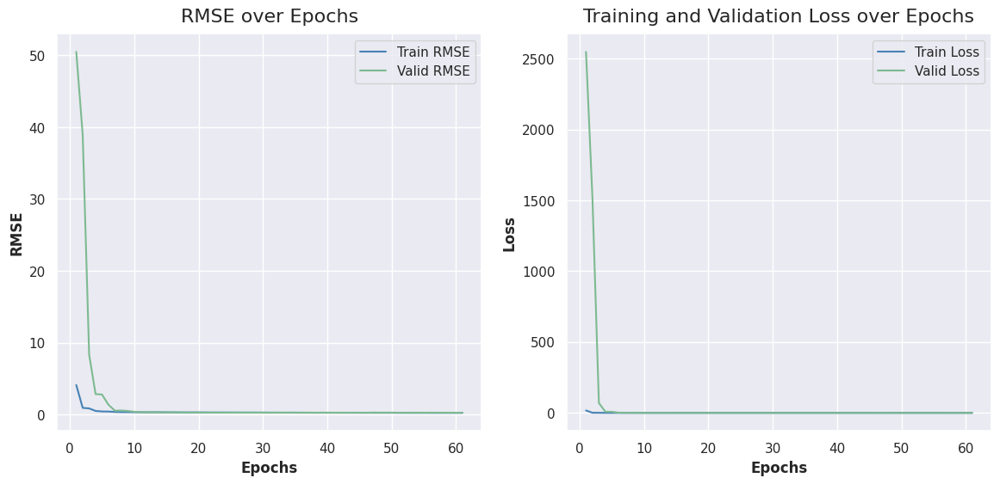

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0723 - root_mean_squared_error: 0.2687


[I 2024-11-08 03:54:42,270] Trial 0 finished with value: 0.2663184702396393 and parameters: {'n_hidden_neurons_1': 1609, 'n_hidden_neurons_2': 83, 'dropout_rate': 0.16336482349262754, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 13s - 2s/step - loss: 206.9702 - root_mean_squared_error: 14.3865 - val_loss: 25094.5645 - val_root_mean_squared_error: 158.4126 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 18ms/step - loss: 30.1839 - root_mean_squared_error: 5.4940 - val_loss: 48443.4648 - val_root_mean_squared_error: 220.0988 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 26ms/step - loss: 46.4875 - root_mean_squared_error: 6.8182 - val_loss: 1243.5869 - val_root_mean_squared_error: 35.2645 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 40ms/step - loss: 4.4386 - root_mean_squared_error: 2.1068 - val_loss: 897.9543 - val_root_mean_squared_error: 29.9659 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 41ms/step - loss: 10.1608 - root_mean_squared_error: 3.1876 - val_loss: 106.3872 - val_root_mean_squared_error: 10.3144 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 25ms/step - loss: 0.9278 - root_mean_squared_error: 0.9632 - val_loss: 68.4585 - val_root_mean_squared_error: 8.2740 - learning_r

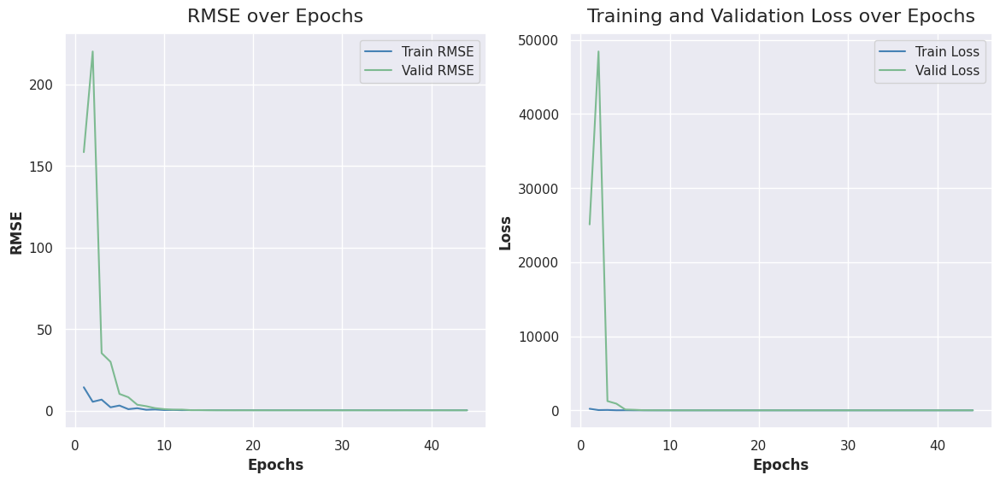

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0735 - root_mean_squared_error: 0.2711


[I 2024-11-08 03:55:08,149] Trial 1 finished with value: 0.27060818672180176 and parameters: {'n_hidden_neurons_1': 1566, 'n_hidden_neurons_2': 543, 'dropout_rate': 0.12247966455308477, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 7s - 1s/step - loss: 91.5530 - root_mean_squared_error: 9.5683 - val_loss: 1080.1442 - val_root_mean_squared_error: 32.8655 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 17ms/step - loss: 4.4980 - root_mean_squared_error: 2.1208 - val_loss: 598.8118 - val_root_mean_squared_error: 24.4706 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 19ms/step - loss: 1.6562 - root_mean_squared_error: 1.2869 - val_loss: 2428.2451 - val_root_mean_squared_error: 49.2772 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 18ms/step - loss: 1.0893 - root_mean_squared_error: 1.0437 - val_loss: 632.6418 - val_root_mean_squared_error: 25.1524 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 22ms/step - loss: 0.4359 - root_mean_squared_error: 0.6602 - val_loss: 14.7518 - val_root_mean_squared_error: 3.8408 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 16ms/step - loss: 0.4289 - root_mean_squared_error: 0.6549 - val_loss: 38.4946 - val_root_mean_squared_error: 6.2044 - learning_rate: 0.0100
E

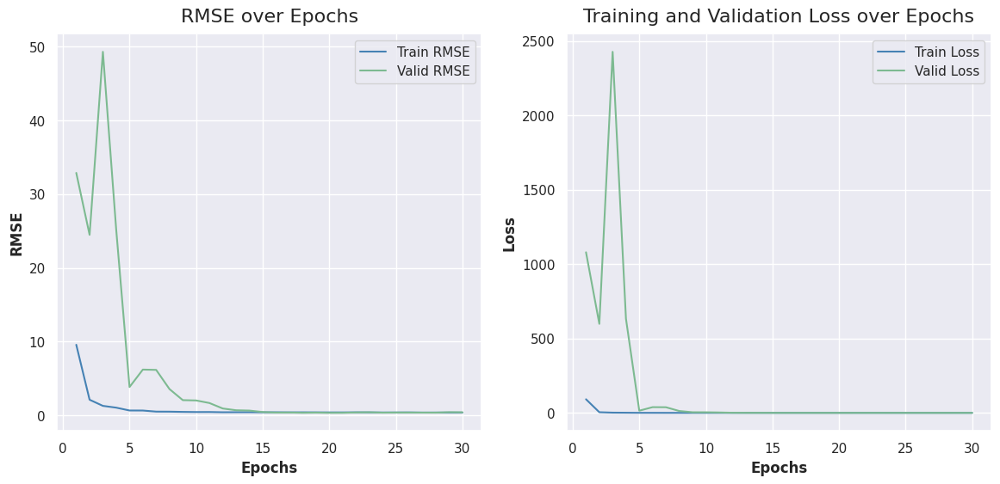

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.1191 - root_mean_squared_error: 0.3449


[I 2024-11-08 03:55:21,366] Trial 2 finished with value: 0.33837422728538513 and parameters: {'n_hidden_neurons_1': 508, 'n_hidden_neurons_2': 794, 'dropout_rate': 0.11691108365625355, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 11s - 2s/step - loss: 123.8113 - root_mean_squared_error: 11.1271 - val_loss: 718.2767 - val_root_mean_squared_error: 26.8007 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 13ms/step - loss: 5.5705 - root_mean_squared_error: 2.3602 - val_loss: 1950.5862 - val_root_mean_squared_error: 44.1654 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 14ms/step - loss: 2.0144 - root_mean_squared_error: 1.4193 - val_loss: 14.0168 - val_root_mean_squared_error: 3.7439 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 14ms/step - loss: 1.2276 - root_mean_squared_error: 1.1080 - val_loss: 456.8320 - val_root_mean_squared_error: 21.3736 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 13ms/step - loss: 0.9297 - root_mean_squared_error: 0.9642 - val_loss: 20.8435 - val_root_mean_squared_error: 4.5655 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 21ms/step - loss: 0.5799 - root_mean_squared_error: 0.7615 - val_loss: 8.2976 - val_root_mean_squared_error: 2.8806 - learning_rate: 0.0100
Ep

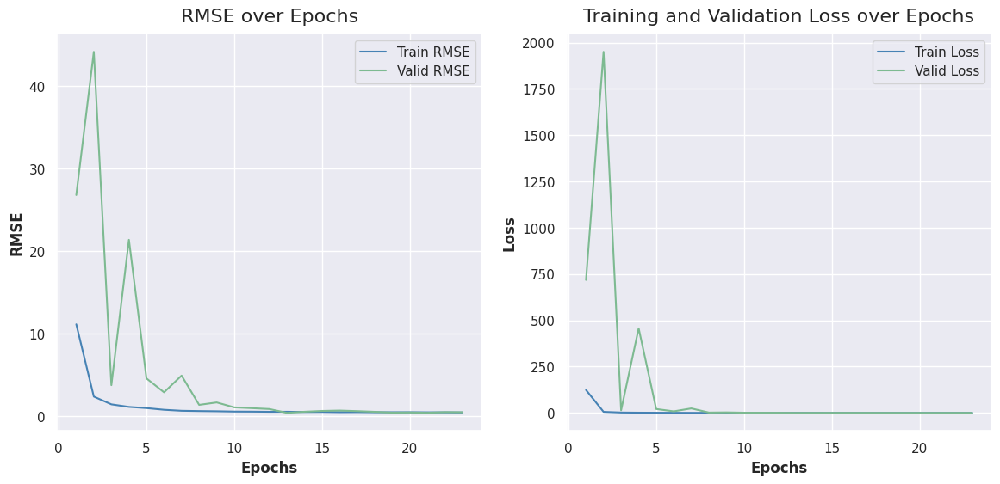

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.1459 - root_mean_squared_error: 0.3818


[I 2024-11-08 03:55:37,606] Trial 3 finished with value: 0.3896968364715576 and parameters: {'n_hidden_neurons_1': 297, 'n_hidden_neurons_2': 722, 'dropout_rate': 0.19533933461949365, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 11s - 2s/step - loss: 63.7150 - root_mean_squared_error: 7.9822 - val_loss: 78.0821 - val_root_mean_squared_error: 8.8364 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 2s - 309ms/step - loss: 2.8972 - root_mean_squared_error: 1.7021 - val_loss: 44.2626 - val_root_mean_squared_error: 6.6530 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 20ms/step - loss: 1.2292 - root_mean_squared_error: 1.1087 - val_loss: 4.1943 - val_root_mean_squared_error: 2.0480 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 13ms/step - loss: 0.6015 - root_mean_squared_error: 0.7755 - val_loss: 42.4421 - val_root_mean_squared_error: 6.5148 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 22ms/step - loss: 0.4359 - root_mean_squared_error: 0.6602 - val_loss: 2.3539 - val_root_mean_squared_error: 1.5342 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 12ms/step - loss: 0.3178 - root_mean_squared_error: 0.5637 - val_loss: 7.9786 - val_root_mean_squared_error: 2.8246 - learning_rate: 0.0100
Epoch 7/2000

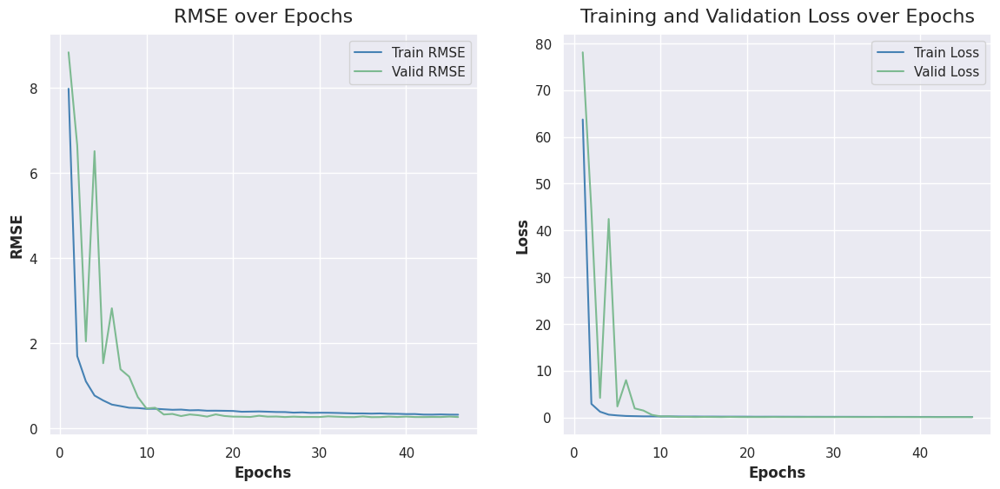

26/26 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step - loss: 0.0725 - root_mean_squared_error: 0.2692


[I 2024-11-08 03:56:01,618] Trial 4 finished with value: 0.26845958828926086 and parameters: {'n_hidden_neurons_1': 135, 'n_hidden_neurons_2': 556, 'dropout_rate': 0.18126209616521136, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 7s - 1s/step - loss: 217.5450 - root_mean_squared_error: 14.7494 - val_loss: 1151.3513 - val_root_mean_squared_error: 33.9316 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 14ms/step - loss: 62.6861 - root_mean_squared_error: 7.9175 - val_loss: 12726.5938 - val_root_mean_squared_error: 112.8122 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 30ms/step - loss: 20.0149 - root_mean_squared_error: 4.4738 - val_loss: 2450.7419 - val_root_mean_squared_error: 49.5050 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 56ms/step - loss: 14.4151 - root_mean_squared_error: 3.7967 - val_loss: 512.6711 - val_root_mean_squared_error: 22.6422 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 1s - 80ms/step - loss: 3.4583 - root_mean_squared_error: 1.8597 - val_loss: 501.4744 - val_root_mean_squared_error: 22.3936 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 39ms/step - loss: 3.1669 - root_mean_squared_error: 1.7796 - val_loss: 49.5207 - val_root_mean_squared_error: 7.0371 - learning_rate

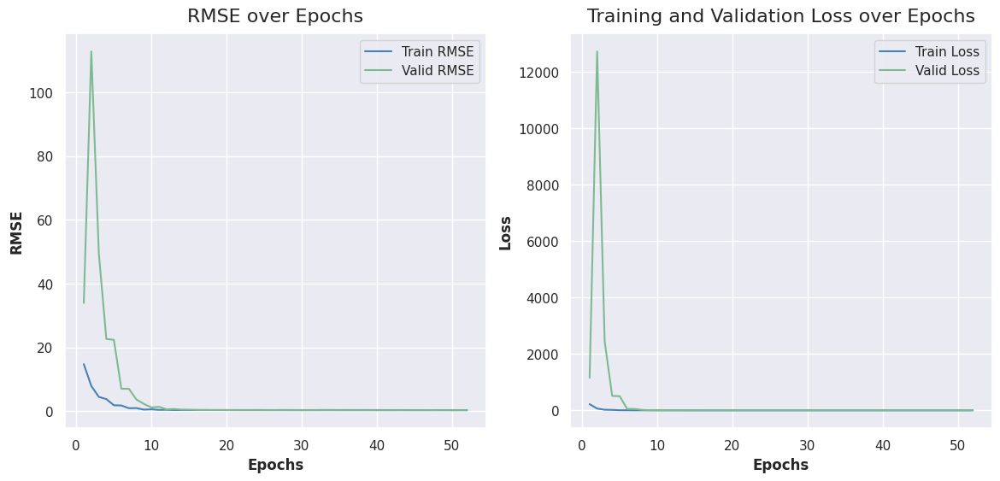

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0753 - root_mean_squared_error: 0.2744


[I 2024-11-08 03:56:22,075] Trial 5 finished with value: 0.27363482117652893 and parameters: {'n_hidden_neurons_1': 1304, 'n_hidden_neurons_2': 757, 'dropout_rate': 0.12918760681706332, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 14s - 2s/step - loss: 212.1495 - root_mean_squared_error: 14.5654 - val_loss: 3770.0037 - val_root_mean_squared_error: 61.4004 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 15ms/step - loss: 71.9022 - root_mean_squared_error: 8.4795 - val_loss: 91983.6953 - val_root_mean_squared_error: 303.2881 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 18ms/step - loss: 22.2952 - root_mean_squared_error: 4.7218 - val_loss: 1065.0548 - val_root_mean_squared_error: 32.6352 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 18ms/step - loss: 20.8757 - root_mean_squared_error: 4.5690 - val_loss: 1449.9293 - val_root_mean_squared_error: 38.0779 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 18ms/step - loss: 3.1599 - root_mean_squared_error: 1.7776 - val_loss: 552.8668 - val_root_mean_squared_error: 23.5131 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 19ms/step - loss: 5.2271 - root_mean_squared_error: 2.2863 - val_loss: 29.1218 - val_root_mean_squared_error: 5.3965 - learning_ra

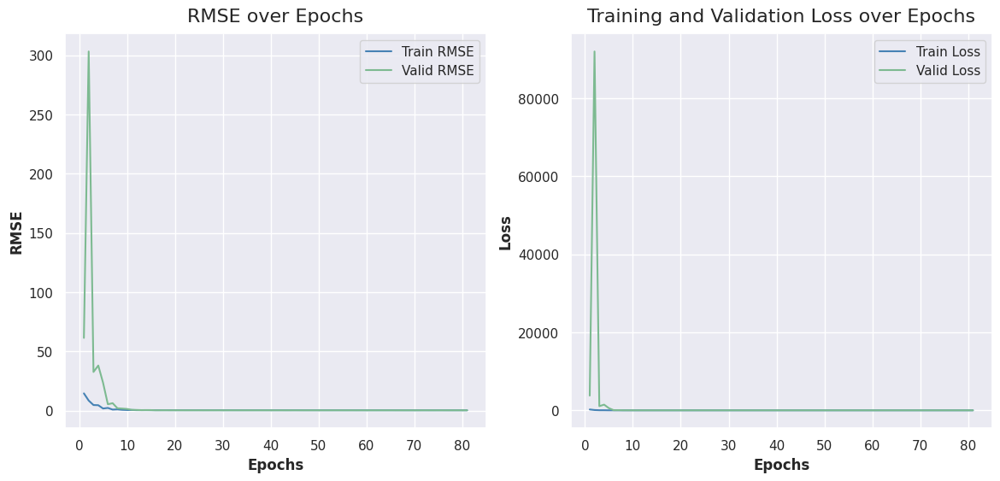

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0731 - root_mean_squared_error: 0.2704


[I 2024-11-08 03:56:51,580] Trial 6 finished with value: 0.2679082155227661 and parameters: {'n_hidden_neurons_1': 1891, 'n_hidden_neurons_2': 750, 'dropout_rate': 0.15425443680112613, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 10s - 1s/step - loss: 89.1843 - root_mean_squared_error: 9.4437 - val_loss: 865.9834 - val_root_mean_squared_error: 29.4276 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 19ms/step - loss: 6.4930 - root_mean_squared_error: 2.5481 - val_loss: 57.9493 - val_root_mean_squared_error: 7.6124 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 13ms/step - loss: 1.4257 - root_mean_squared_error: 1.1940 - val_loss: 193.7594 - val_root_mean_squared_error: 13.9197 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 15ms/step - loss: 0.6190 - root_mean_squared_error: 0.7868 - val_loss: 25.0416 - val_root_mean_squared_error: 5.0042 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 29ms/step - loss: 0.4657 - root_mean_squared_error: 0.6824 - val_loss: 79.8769 - val_root_mean_squared_error: 8.9374 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 19ms/step - loss: 0.2893 - root_mean_squared_error: 0.5379 - val_loss: 31.1595 - val_root_mean_squared_error: 5.5821 - learning_rate: 0.0100
Epoch 

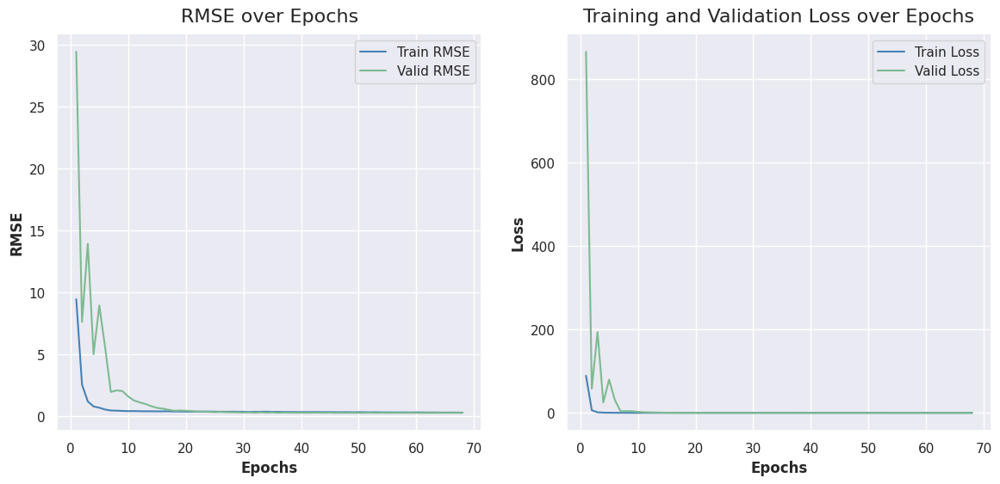

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0735 - root_mean_squared_error: 0.2710


[I 2024-11-08 03:57:16,209] Trial 7 finished with value: 0.2681822180747986 and parameters: {'n_hidden_neurons_1': 401, 'n_hidden_neurons_2': 422, 'dropout_rate': 0.16741336150663455, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 11s - 2s/step - loss: 148.7774 - root_mean_squared_error: 12.1974 - val_loss: 3702.2700 - val_root_mean_squared_error: 60.8463 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 15ms/step - loss: 18.8228 - root_mean_squared_error: 4.3385 - val_loss: 13815.1377 - val_root_mean_squared_error: 117.5378 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 20ms/step - loss: 21.5869 - root_mean_squared_error: 4.6462 - val_loss: 1280.4950 - val_root_mean_squared_error: 35.7840 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 20ms/step - loss: 3.1497 - root_mean_squared_error: 1.7747 - val_loss: 320.3784 - val_root_mean_squared_error: 17.8991 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 18ms/step - loss: 3.3723 - root_mean_squared_error: 1.8364 - val_loss: 103.7497 - val_root_mean_squared_error: 10.1858 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 16ms/step - loss: 1.2102 - root_mean_squared_error: 1.1001 - val_loss: 65.4766 - val_root_mean_squared_error: 8.0918 - learning_rate

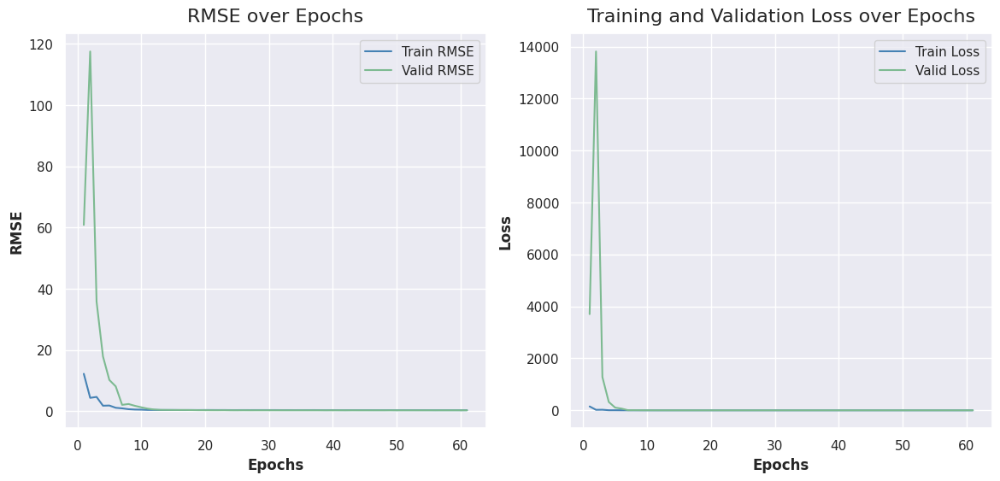

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0745 - root_mean_squared_error: 0.2730


[I 2024-11-08 03:57:39,840] Trial 8 finished with value: 0.2719379961490631 and parameters: {'n_hidden_neurons_1': 976, 'n_hidden_neurons_2': 481, 'dropout_rate': 0.16177669784693172, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 11s - 2s/step - loss: 192.1500 - root_mean_squared_error: 13.8618 - val_loss: 1326.8864 - val_root_mean_squared_error: 36.4264 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 38ms/step - loss: 37.0393 - root_mean_squared_error: 6.0860 - val_loss: 3957.9802 - val_root_mean_squared_error: 62.9125 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 33ms/step - loss: 12.6425 - root_mean_squared_error: 3.5556 - val_loss: 7489.9453 - val_root_mean_squared_error: 86.5445 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 48ms/step - loss: 10.3000 - root_mean_squared_error: 3.2094 - val_loss: 514.8771 - val_root_mean_squared_error: 22.6909 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 46ms/step - loss: 1.4276 - root_mean_squared_error: 1.1948 - val_loss: 257.7890 - val_root_mean_squared_error: 16.0558 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 24ms/step - loss: 2.4609 - root_mean_squared_error: 1.5687 - val_loss: 24.9738 - val_root_mean_squared_error: 4.9974 - learning_rate:

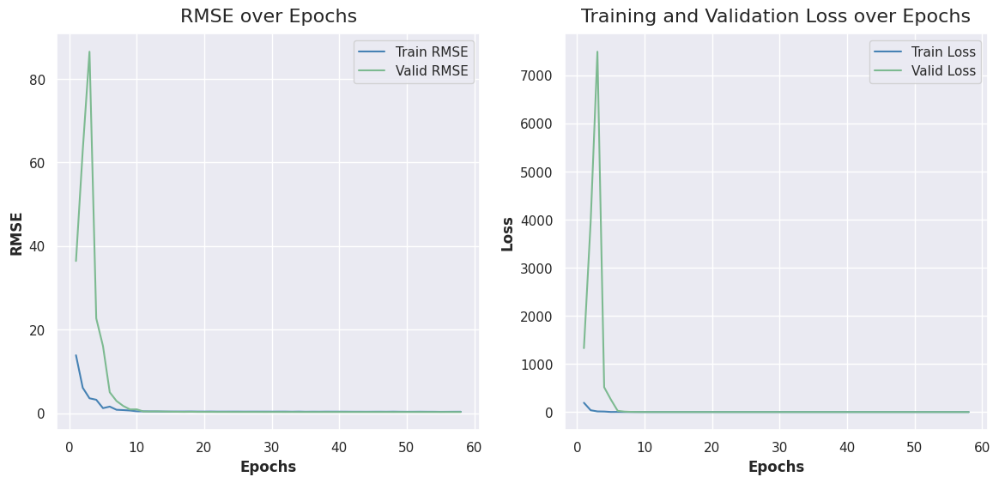

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0738 - root_mean_squared_error: 0.2717


[I 2024-11-08 03:58:06,432] Trial 9 finished with value: 0.27208977937698364 and parameters: {'n_hidden_neurons_1': 1113, 'n_hidden_neurons_2': 689, 'dropout_rate': 0.16010389534045444, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 9s - 1s/step - loss: 29.0284 - root_mean_squared_error: 5.3878 - val_loss: 1470.1526 - val_root_mean_squared_error: 38.3426 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 4s - 555ms/step - loss: 0.7534 - root_mean_squared_error: 0.8680 - val_loss: 709.1489 - val_root_mean_squared_error: 26.6299 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 69ms/step - loss: 1.5124 - root_mean_squared_error: 1.2298 - val_loss: 69.4040 - val_root_mean_squared_error: 8.3309 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 59ms/step - loss: 0.4032 - root_mean_squared_error: 0.6350 - val_loss: 7.4754 - val_root_mean_squared_error: 2.7341 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 68ms/step - loss: 0.2383 - root_mean_squared_error: 0.4881 - val_loss: 13.3330 - val_root_mean_squared_error: 3.6514 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 40ms/step - loss: 0.2726 - root_mean_squared_error: 0.5221 - val_loss: 2.5042 - val_root_mean_squared_error: 1.5825 - learning_rate: 0.0100
Epoch 7

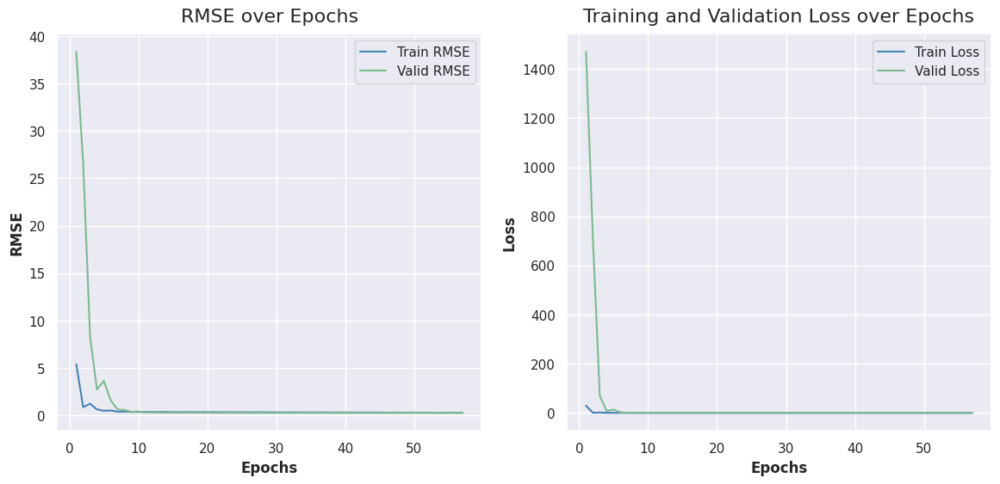

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0737 - root_mean_squared_error: 0.2714


[I 2024-11-08 03:58:32,432] Trial 10 finished with value: 0.26933905482292175 and parameters: {'n_hidden_neurons_1': 1919, 'n_hidden_neurons_2': 88, 'dropout_rate': 0.13859258861139861, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 8s - 1s/step - loss: 31.1964 - root_mean_squared_error: 5.5854 - val_loss: 271.5745 - val_root_mean_squared_error: 16.4795 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 4s - 555ms/step - loss: 0.7484 - root_mean_squared_error: 0.8651 - val_loss: 536.1804 - val_root_mean_squared_error: 23.1556 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 20ms/step - loss: 1.3829 - root_mean_squared_error: 1.1760 - val_loss: 77.5059 - val_root_mean_squared_error: 8.8037 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 22ms/step - loss: 0.6062 - root_mean_squared_error: 0.7786 - val_loss: 6.1029 - val_root_mean_squared_error: 2.4704 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 17ms/step - loss: 0.2039 - root_mean_squared_error: 0.4516 - val_loss: 7.3353 - val_root_mean_squared_error: 2.7084 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 19ms/step - loss: 0.2379 - root_mean_squared_error: 0.4878 - val_loss: 2.5835 - val_root_mean_squared_error: 1.6073 - learning_rate: 0.0100
Epoch 7/2

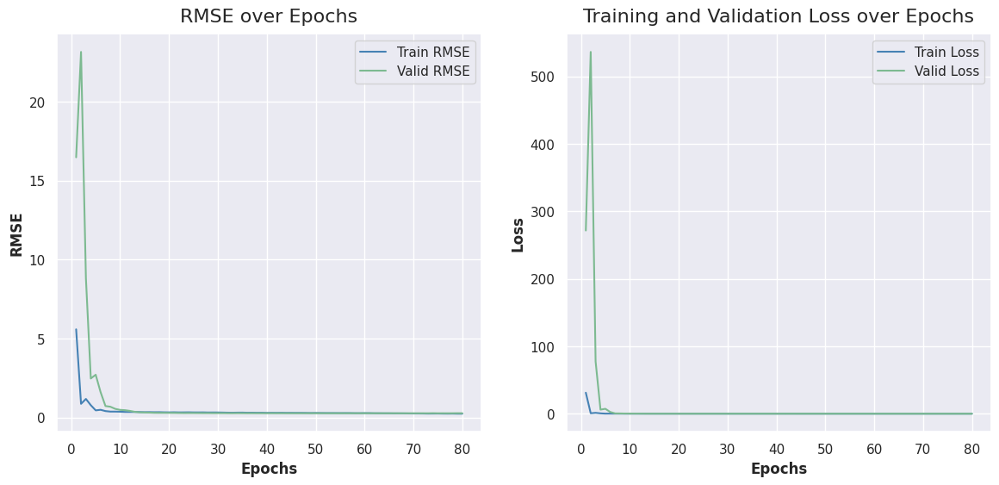

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0724 - root_mean_squared_error: 0.2690


[I 2024-11-08 03:59:00,046] Trial 11 finished with value: 0.2670220732688904 and parameters: {'n_hidden_neurons_1': 1931, 'n_hidden_neurons_2': 78, 'dropout_rate': 0.14588735428444502, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 9s - 1s/step - loss: 32.5627 - root_mean_squared_error: 5.7064 - val_loss: 3625.7556 - val_root_mean_squared_error: 60.2142 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 3s - 465ms/step - loss: 1.3404 - root_mean_squared_error: 1.1577 - val_loss: 1004.0654 - val_root_mean_squared_error: 31.6870 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 22ms/step - loss: 1.7825 - root_mean_squared_error: 1.3351 - val_loss: 115.9810 - val_root_mean_squared_error: 10.7694 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 19ms/step - loss: 0.6449 - root_mean_squared_error: 0.8031 - val_loss: 3.7440 - val_root_mean_squared_error: 1.9350 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 17ms/step - loss: 0.2553 - root_mean_squared_error: 0.5053 - val_loss: 4.9240 - val_root_mean_squared_error: 2.2190 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 17ms/step - loss: 0.2738 - root_mean_squared_error: 0.5233 - val_loss: 4.5072 - val_root_mean_squared_error: 2.1230 - learning_rate: 0.0100
Epoch

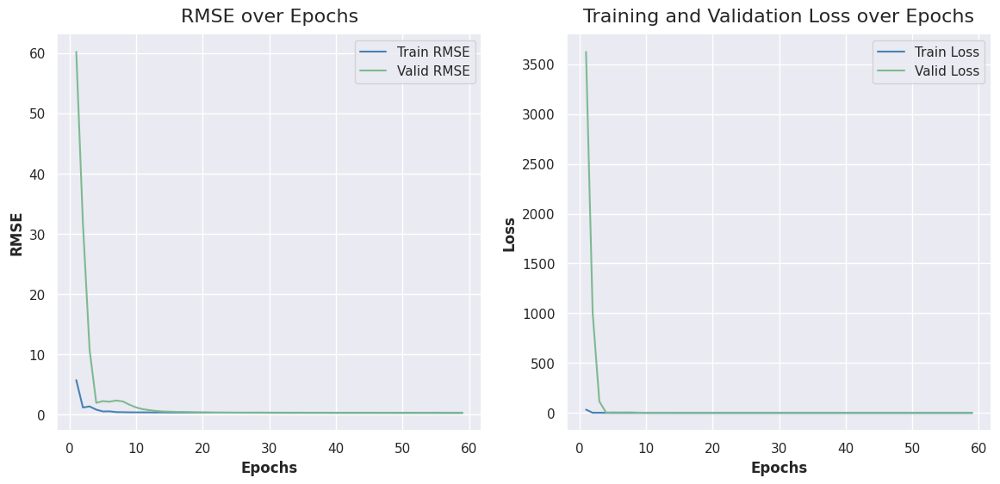

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0730 - root_mean_squared_error: 0.2701


[I 2024-11-08 03:59:26,314] Trial 12 finished with value: 0.26885542273521423 and parameters: {'n_hidden_neurons_1': 1586, 'n_hidden_neurons_2': 85, 'dropout_rate': 0.1466647446562683, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 11s - 2s/step - loss: 108.8961 - root_mean_squared_error: 10.4353 - val_loss: 12400.2744 - val_root_mean_squared_error: 111.3565 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 2s - 285ms/step - loss: 7.3683 - root_mean_squared_error: 2.7145 - val_loss: 3583.8621 - val_root_mean_squared_error: 59.8654 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 22ms/step - loss: 22.1513 - root_mean_squared_error: 4.7065 - val_loss: 1121.1357 - val_root_mean_squared_error: 33.4834 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 43ms/step - loss: 4.1834 - root_mean_squared_error: 2.0453 - val_loss: 31.9244 - val_root_mean_squared_error: 5.6502 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 41ms/step - loss: 1.8163 - root_mean_squared_error: 1.3477 - val_loss: 62.0491 - val_root_mean_squared_error: 7.8771 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 22ms/step - loss: 2.3127 - root_mean_squared_error: 1.5207 - val_loss: 10.4323 - val_root_mean_squared_error: 3.2299 - learning_rate: 0.

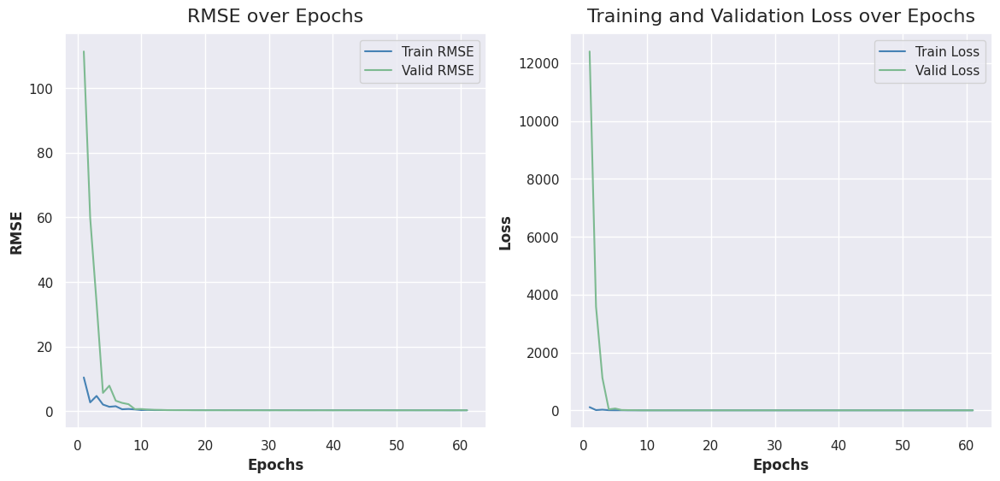

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0734 - root_mean_squared_error: 0.2709


[I 2024-11-08 03:59:56,205] Trial 13 finished with value: 0.27045348286628723 and parameters: {'n_hidden_neurons_1': 2003, 'n_hidden_neurons_2': 291, 'dropout_rate': 0.10475342624651394, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 10s - 1s/step - loss: 86.4902 - root_mean_squared_error: 9.3000 - val_loss: 15736.8672 - val_root_mean_squared_error: 125.4467 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 18ms/step - loss: 4.8866 - root_mean_squared_error: 2.2106 - val_loss: 3070.4722 - val_root_mean_squared_error: 55.4118 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 18ms/step - loss: 11.4989 - root_mean_squared_error: 3.3910 - val_loss: 729.1759 - val_root_mean_squared_error: 27.0033 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 19ms/step - loss: 1.8117 - root_mean_squared_error: 1.3460 - val_loss: 25.9593 - val_root_mean_squared_error: 5.0950 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 18ms/step - loss: 0.7479 - root_mean_squared_error: 0.8648 - val_loss: 50.7152 - val_root_mean_squared_error: 7.1215 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 13ms/step - loss: 0.7476 - root_mean_squared_error: 0.8646 - val_loss: 51.4114 - val_root_mean_squared_error: 7.1702 - learning_rate: 0.0100

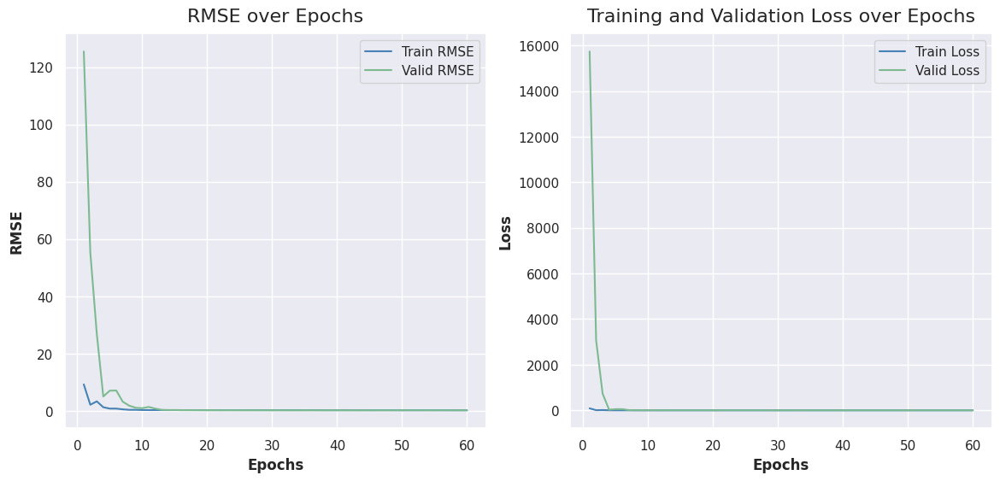

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0733 - root_mean_squared_error: 0.2706


[I 2024-11-08 04:00:18,122] Trial 14 finished with value: 0.2695361375808716 and parameters: {'n_hidden_neurons_1': 1614, 'n_hidden_neurons_2': 248, 'dropout_rate': 0.17235606600148362, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 8s - 1s/step - loss: 242.8697 - root_mean_squared_error: 15.5843 - val_loss: 10650.0684 - val_root_mean_squared_error: 103.1992 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 27ms/step - loss: 93.6049 - root_mean_squared_error: 9.6750 - val_loss: 4023.5256 - val_root_mean_squared_error: 63.4313 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 23ms/step - loss: 15.0953 - root_mean_squared_error: 3.8853 - val_loss: 3424.5505 - val_root_mean_squared_error: 58.5197 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 47ms/step - loss: 19.0083 - root_mean_squared_error: 4.3598 - val_loss: 388.6563 - val_root_mean_squared_error: 19.7144 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 63ms/step - loss: 6.2689 - root_mean_squared_error: 2.5038 - val_loss: 140.2444 - val_root_mean_squared_error: 11.8425 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 1s - 99ms/step - loss: 2.3743 - root_mean_squared_error: 1.5409 - val_loss: 179.1927 - val_root_mean_squared_error: 13.3863 - learning_ra

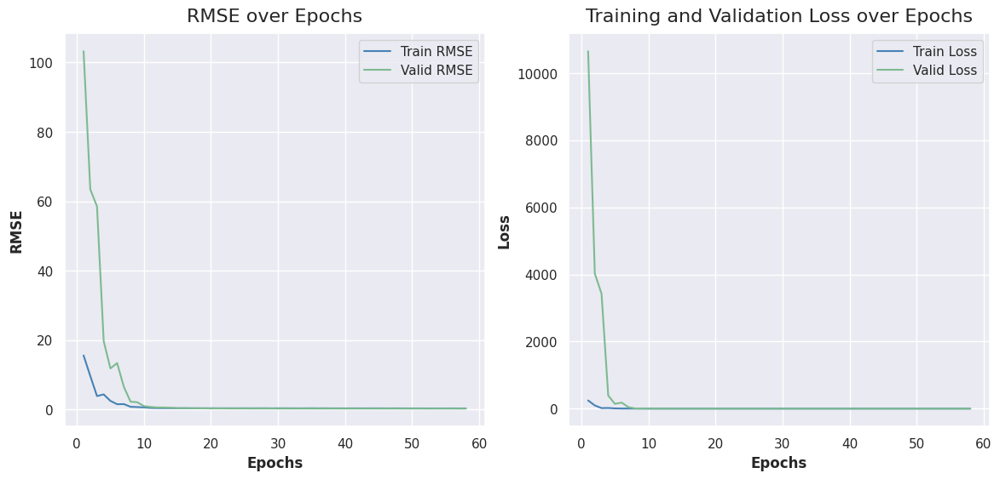

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0752 - root_mean_squared_error: 0.2742


[I 2024-11-08 04:00:42,396] Trial 15 finished with value: 0.275858610868454 and parameters: {'n_hidden_neurons_1': 1338, 'n_hidden_neurons_2': 990, 'dropout_rate': 0.14492989535963935, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 10s - 1s/step - loss: 86.6414 - root_mean_squared_error: 9.3081 - val_loss: 17205.4414 - val_root_mean_squared_error: 131.1695 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 23ms/step - loss: 5.8352 - root_mean_squared_error: 2.4156 - val_loss: 3103.1370 - val_root_mean_squared_error: 55.7058 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 20ms/step - loss: 15.9078 - root_mean_squared_error: 3.9885 - val_loss: 1122.4764 - val_root_mean_squared_error: 33.5034 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 19ms/step - loss: 4.4670 - root_mean_squared_error: 2.1135 - val_loss: 8.4850 - val_root_mean_squared_error: 2.9129 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 18ms/step - loss: 1.0620 - root_mean_squared_error: 1.0305 - val_loss: 89.2657 - val_root_mean_squared_error: 9.4481 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 18ms/step - loss: 1.8731 - root_mean_squared_error: 1.3686 - val_loss: 17.1383 - val_root_mean_squared_error: 4.1398 - learning_rate: 0.0100

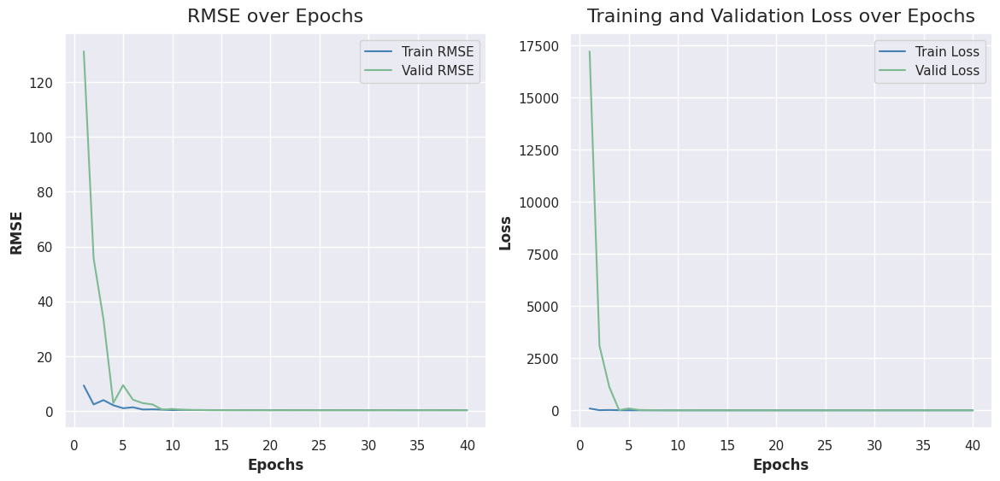

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - loss: 0.0741 - root_mean_squared_error: 0.2722


[I 2024-11-08 04:01:04,024] Trial 16 finished with value: 0.27031680941581726 and parameters: {'n_hidden_neurons_1': 1780, 'n_hidden_neurons_2': 226, 'dropout_rate': 0.1839610998982483, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 8s - 1s/step - loss: 38.9300 - root_mean_squared_error: 6.2394 - val_loss: 345.4993 - val_root_mean_squared_error: 18.5876 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 4s - 568ms/step - loss: 2.0306 - root_mean_squared_error: 1.4250 - val_loss: 777.0411 - val_root_mean_squared_error: 27.8755 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 47ms/step - loss: 1.6519 - root_mean_squared_error: 1.2852 - val_loss: 64.8285 - val_root_mean_squared_error: 8.0516 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 21ms/step - loss: 0.2446 - root_mean_squared_error: 0.4946 - val_loss: 157.4676 - val_root_mean_squared_error: 12.5486 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 39ms/step - loss: 0.3302 - root_mean_squared_error: 0.5746 - val_loss: 45.8072 - val_root_mean_squared_error: 6.7681 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 21ms/step - loss: 0.2224 - root_mean_squared_error: 0.4716 - val_loss: 2.8747 - val_root_mean_squared_error: 1.6955 - learning_rate: 0.0100
Epoch

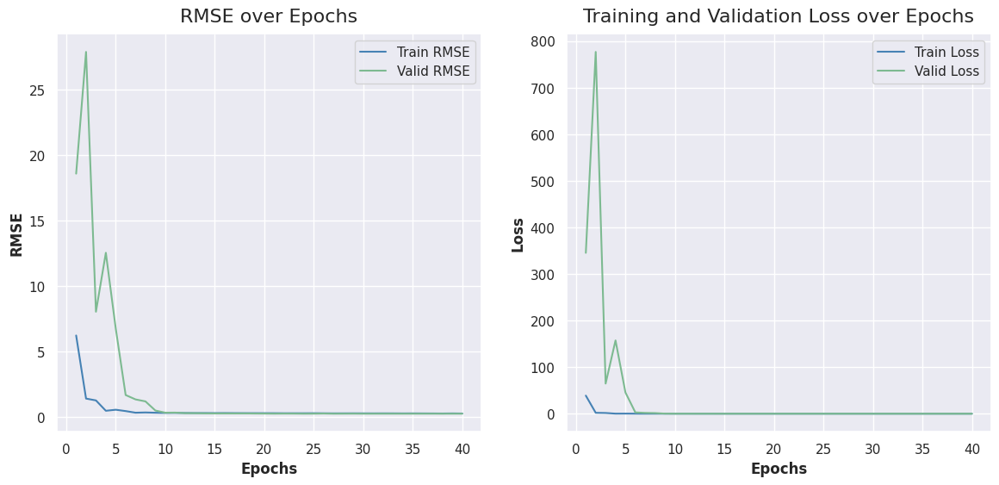

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0723 - root_mean_squared_error: 0.2688


[I 2024-11-08 04:01:27,558] Trial 17 finished with value: 0.2704029083251953 and parameters: {'n_hidden_neurons_1': 933, 'n_hidden_neurons_2': 162, 'dropout_rate': 0.13906270924321962, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 8s - 1s/step - loss: 101.1587 - root_mean_squared_error: 10.0578 - val_loss: 626.1260 - val_root_mean_squared_error: 25.0225 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 15ms/step - loss: 4.2666 - root_mean_squared_error: 2.0656 - val_loss: 3542.2549 - val_root_mean_squared_error: 59.5168 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 16ms/step - loss: 2.8196 - root_mean_squared_error: 1.6792 - val_loss: 192.1720 - val_root_mean_squared_error: 13.8626 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 16ms/step - loss: 0.7358 - root_mean_squared_error: 0.8578 - val_loss: 25.8556 - val_root_mean_squared_error: 5.0848 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 17ms/step - loss: 0.3338 - root_mean_squared_error: 0.5777 - val_loss: 11.5060 - val_root_mean_squared_error: 3.3921 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 19ms/step - loss: 0.3014 - root_mean_squared_error: 0.5490 - val_loss: 3.2495 - val_root_mean_squared_error: 1.8026 - learning_rate: 0.0100
Epo

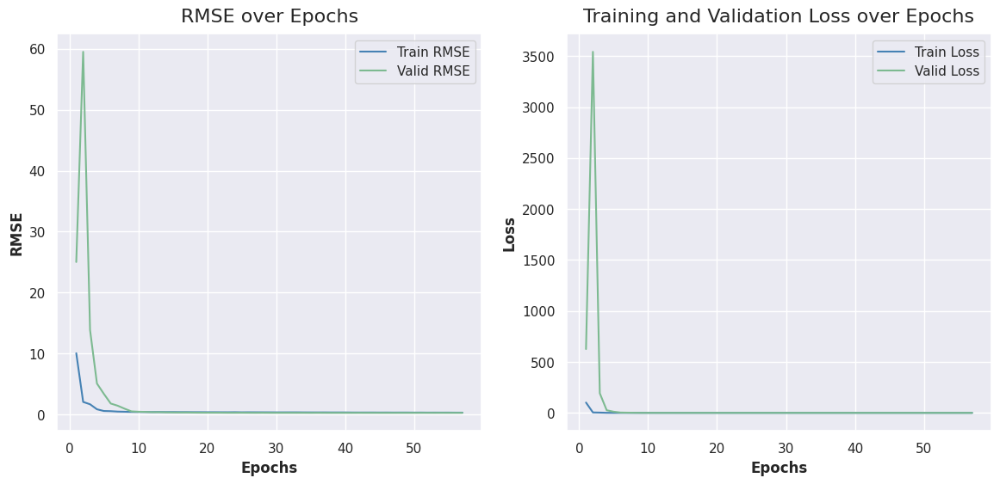

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0736 - root_mean_squared_error: 0.2713


[I 2024-11-08 04:01:48,051] Trial 18 finished with value: 0.2707434892654419 and parameters: {'n_hidden_neurons_1': 687, 'n_hidden_neurons_2': 337, 'dropout_rate': 0.1763546830347688, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 9s - 1s/step - loss: 129.5770 - root_mean_squared_error: 11.3832 - val_loss: 8467.5820 - val_root_mean_squared_error: 92.0195 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 3s - 462ms/step - loss: 11.5569 - root_mean_squared_error: 3.3995 - val_loss: 14797.1934 - val_root_mean_squared_error: 121.6437 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 40ms/step - loss: 24.1067 - root_mean_squared_error: 4.9099 - val_loss: 3346.5605 - val_root_mean_squared_error: 57.8495 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 19ms/step - loss: 1.8037 - root_mean_squared_error: 1.3430 - val_loss: 589.0859 - val_root_mean_squared_error: 24.2711 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 29ms/step - loss: 3.5419 - root_mean_squared_error: 1.8820 - val_loss: 124.7768 - val_root_mean_squared_error: 11.1704 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 24ms/step - loss: 1.0107 - root_mean_squared_error: 1.0053 - val_loss: 98.7589 - val_root_mean_squared_error: 9.9378 - learning_rate

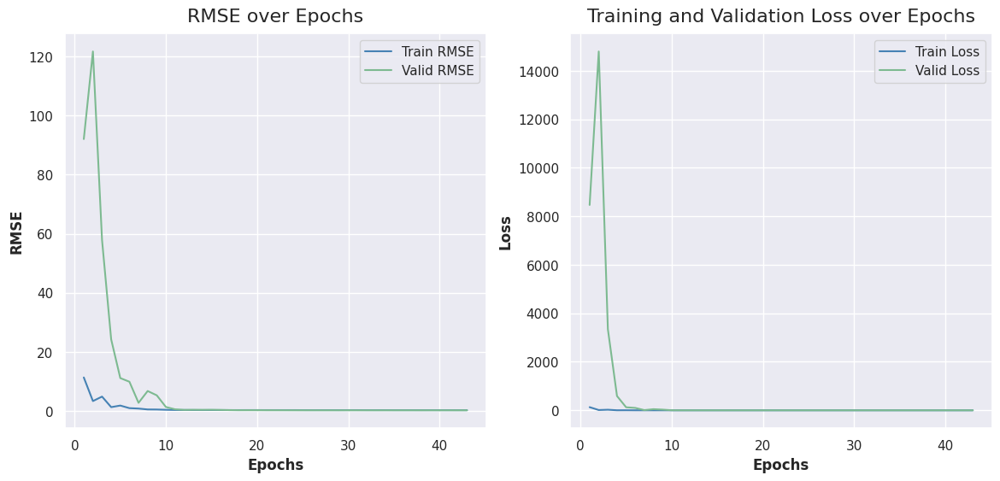

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - loss: 0.0751 - root_mean_squared_error: 0.2740


[I 2024-11-08 04:02:13,429] Trial 19 finished with value: 0.27377381920814514 and parameters: {'n_hidden_neurons_1': 1364, 'n_hidden_neurons_2': 372, 'dropout_rate': 0.19159600317576386, 'learning_rate': 0.01}. Best is trial 0 with value: 0.2663184702396393.


Epoch 1/2000
7/7 - 12s - 2s/step - loss: 66.6193 - root_mean_squared_error: 8.1621 - val_loss: 5135.9404 - val_root_mean_squared_error: 71.6655 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 19ms/step - loss: 3.2544 - root_mean_squared_error: 1.8040 - val_loss: 2757.8423 - val_root_mean_squared_error: 52.5152 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 21ms/step - loss: 7.7406 - root_mean_squared_error: 2.7822 - val_loss: 780.9459 - val_root_mean_squared_error: 27.9454 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 18ms/step - loss: 2.5302 - root_mean_squared_error: 1.5906 - val_loss: 44.6813 - val_root_mean_squared_error: 6.6844 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 18ms/step - loss: 0.3173 - root_mean_squared_error: 0.5633 - val_loss: 14.4638 - val_root_mean_squared_error: 3.8031 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 20ms/step - loss: 0.6631 - root_mean_squared_error: 0.8143 - val_loss: 9.5598 - val_root_mean_squared_error: 3.0919 - learning_rate: 0.0100
Epo

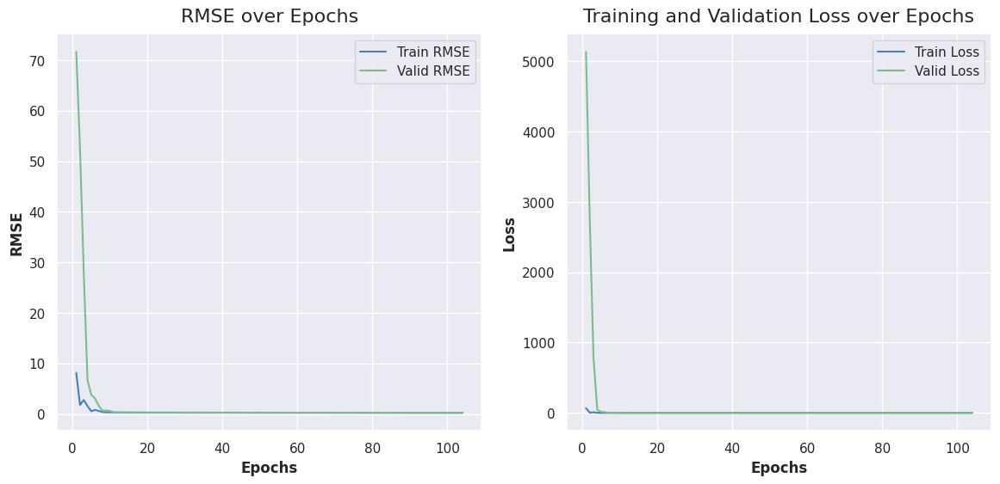

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 0.0714 - root_mean_squared_error: 0.2671


[I 2024-11-08 04:02:49,397] Trial 20 finished with value: 0.2648085355758667 and parameters: {'n_hidden_neurons_1': 1737, 'n_hidden_neurons_2': 187, 'dropout_rate': 0.15503998481979284, 'learning_rate': 0.01}. Best is trial 20 with value: 0.2648085355758667.


Epoch 1/2000
7/7 - 10s - 1s/step - loss: 62.8456 - root_mean_squared_error: 7.9275 - val_loss: 17824.7852 - val_root_mean_squared_error: 133.5095 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 18ms/step - loss: 5.0281 - root_mean_squared_error: 2.2423 - val_loss: 913.7568 - val_root_mean_squared_error: 30.2284 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 19ms/step - loss: 6.0208 - root_mean_squared_error: 2.4537 - val_loss: 900.8685 - val_root_mean_squared_error: 30.0145 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 17ms/step - loss: 4.0858 - root_mean_squared_error: 2.0213 - val_loss: 193.4316 - val_root_mean_squared_error: 13.9080 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 20ms/step - loss: 0.3653 - root_mean_squared_error: 0.6044 - val_loss: 56.8585 - val_root_mean_squared_error: 7.5405 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 19ms/step - loss: 0.9290 - root_mean_squared_error: 0.9638 - val_loss: 13.5537 - val_root_mean_squared_error: 3.6815 - learning_rate: 0.0100

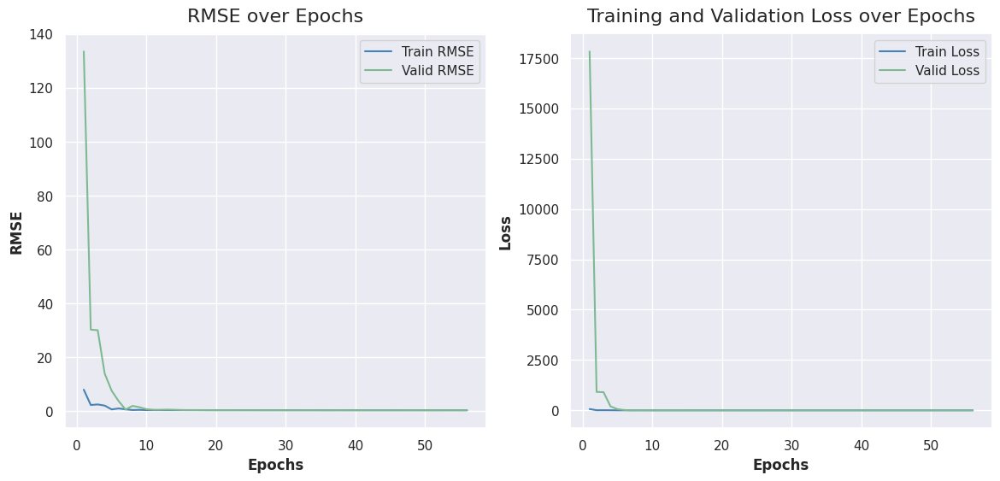

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0758 - root_mean_squared_error: 0.2752


[I 2024-11-08 04:03:15,175] Trial 21 finished with value: 0.27295657992362976 and parameters: {'n_hidden_neurons_1': 1719, 'n_hidden_neurons_2': 143, 'dropout_rate': 0.15278395974799575, 'learning_rate': 0.01}. Best is trial 20 with value: 0.2648085355758667.


Epoch 1/2000
7/7 - 8s - 1s/step - loss: 16.5672 - root_mean_squared_error: 4.0703 - val_loss: 350.0247 - val_root_mean_squared_error: 18.7089 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 3s - 493ms/step - loss: 0.9449 - root_mean_squared_error: 0.9721 - val_loss: 394.2163 - val_root_mean_squared_error: 19.8549 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 22ms/step - loss: 0.8408 - root_mean_squared_error: 0.9170 - val_loss: 38.4271 - val_root_mean_squared_error: 6.1990 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 46ms/step - loss: 0.2270 - root_mean_squared_error: 0.4764 - val_loss: 3.3867 - val_root_mean_squared_error: 1.8403 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 22ms/step - loss: 0.2224 - root_mean_squared_error: 0.4715 - val_loss: 1.4649 - val_root_mean_squared_error: 1.2103 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 42ms/step - loss: 0.1783 - root_mean_squared_error: 0.4222 - val_loss: 0.6622 - val_root_mean_squared_error: 0.8138 - learning_rate: 0.0100
Epoch 7/2

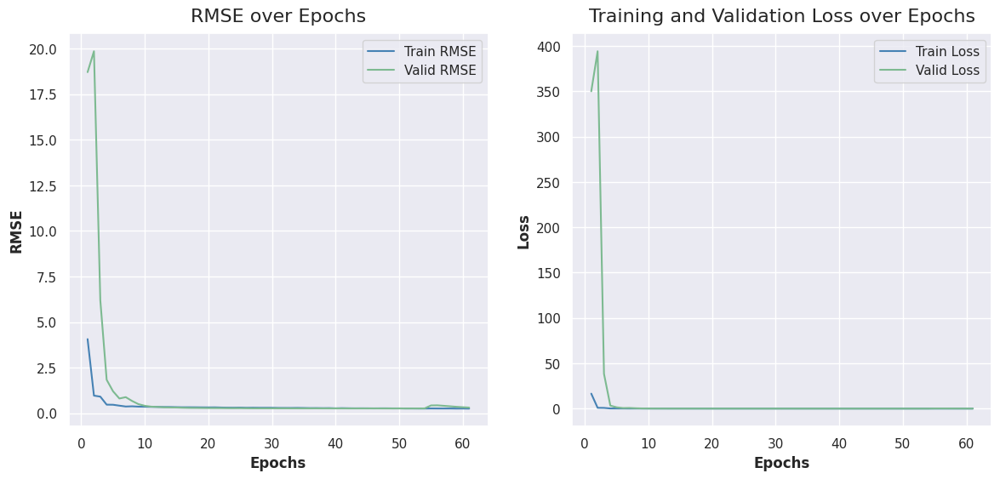

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - loss: 0.0725 - root_mean_squared_error: 0.2692


[I 2024-11-08 04:03:43,818] Trial 22 finished with value: 0.2675466239452362 and parameters: {'n_hidden_neurons_1': 2007, 'n_hidden_neurons_2': 66, 'dropout_rate': 0.16425269377941262, 'learning_rate': 0.01}. Best is trial 20 with value: 0.2648085355758667.


Epoch 1/2000
7/7 - 9s - 1s/step - loss: 56.1881 - root_mean_squared_error: 7.4959 - val_loss: 850.3923 - val_root_mean_squared_error: 29.1615 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 3s - 463ms/step - loss: 1.9523 - root_mean_squared_error: 1.3973 - val_loss: 2819.4661 - val_root_mean_squared_error: 53.0986 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 19ms/step - loss: 3.2628 - root_mean_squared_error: 1.8063 - val_loss: 105.2621 - val_root_mean_squared_error: 10.2597 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 17ms/step - loss: 0.6263 - root_mean_squared_error: 0.7914 - val_loss: 141.3054 - val_root_mean_squared_error: 11.8872 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 25ms/step - loss: 0.3602 - root_mean_squared_error: 0.6002 - val_loss: 71.1050 - val_root_mean_squared_error: 8.4324 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 37ms/step - loss: 0.2433 - root_mean_squared_error: 0.4933 - val_loss: 19.3013 - val_root_mean_squared_error: 4.3933 - learning_rate: 0.0100
E

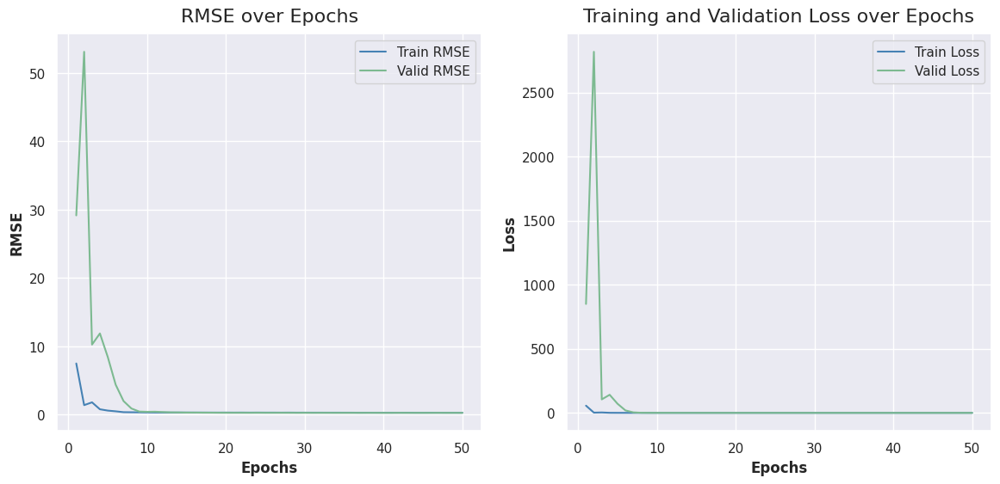

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0713 - root_mean_squared_error: 0.2671


[I 2024-11-08 04:04:07,645] Trial 23 finished with value: 0.2665984034538269 and parameters: {'n_hidden_neurons_1': 1466, 'n_hidden_neurons_2': 178, 'dropout_rate': 0.15465563107414831, 'learning_rate': 0.01}. Best is trial 20 with value: 0.2648085355758667.


Epoch 1/2000
7/7 - 7s - 980ms/step - loss: 87.7223 - root_mean_squared_error: 9.3660 - val_loss: 16696.0859 - val_root_mean_squared_error: 129.2133 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 5s - 707ms/step - loss: 5.8835 - root_mean_squared_error: 2.4256 - val_loss: 3659.0444 - val_root_mean_squared_error: 60.4900 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 19ms/step - loss: 14.8857 - root_mean_squared_error: 3.8582 - val_loss: 1229.3137 - val_root_mean_squared_error: 35.0616 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 19ms/step - loss: 4.2102 - root_mean_squared_error: 2.0519 - val_loss: 16.4647 - val_root_mean_squared_error: 4.0577 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 16ms/step - loss: 1.1011 - root_mean_squared_error: 1.0493 - val_loss: 70.9349 - val_root_mean_squared_error: 8.4223 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 21ms/step - loss: 1.9426 - root_mean_squared_error: 1.3938 - val_loss: 9.8477 - val_root_mean_squared_error: 3.1381 - learning_rate: 0.0

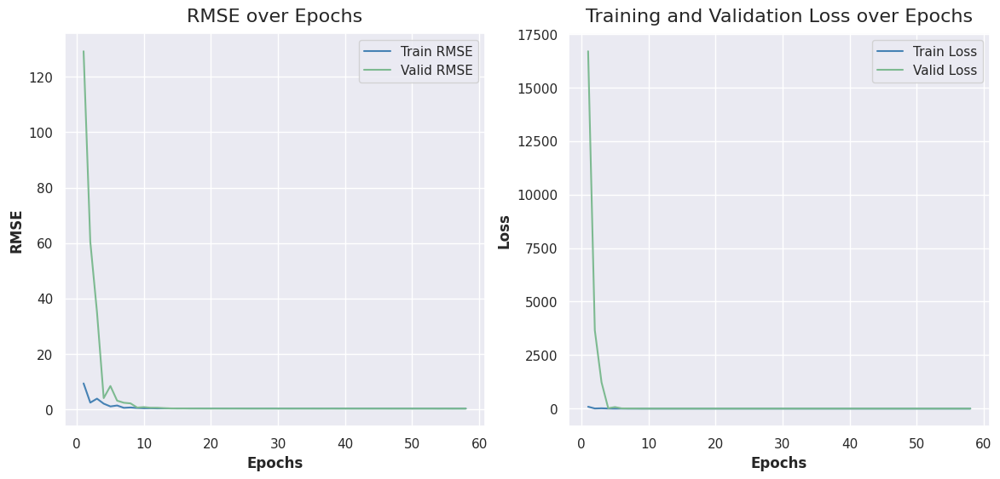

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0743 - root_mean_squared_error: 0.2725


[I 2024-11-08 04:04:32,499] Trial 24 finished with value: 0.2703286409378052 and parameters: {'n_hidden_neurons_1': 1482, 'n_hidden_neurons_2': 218, 'dropout_rate': 0.1573060034741202, 'learning_rate': 0.01}. Best is trial 20 with value: 0.2648085355758667.


Epoch 1/2000
7/7 - 7s - 1s/step - loss: 72.0462 - root_mean_squared_error: 8.4880 - val_loss: 3891.1409 - val_root_mean_squared_error: 62.3790 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 5s - 670ms/step - loss: 3.4187 - root_mean_squared_error: 1.8490 - val_loss: 1799.7524 - val_root_mean_squared_error: 42.4235 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 19ms/step - loss: 7.2517 - root_mean_squared_error: 2.6929 - val_loss: 1110.1356 - val_root_mean_squared_error: 33.3187 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 21ms/step - loss: 1.8063 - root_mean_squared_error: 1.3440 - val_loss: 186.9115 - val_root_mean_squared_error: 13.6716 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 19ms/step - loss: 0.3964 - root_mean_squared_error: 0.6296 - val_loss: 37.8242 - val_root_mean_squared_error: 6.1501 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 18ms/step - loss: 0.5740 - root_mean_squared_error: 0.7576 - val_loss: 9.3140 - val_root_mean_squared_error: 3.0519 - learning_rate: 0.0100


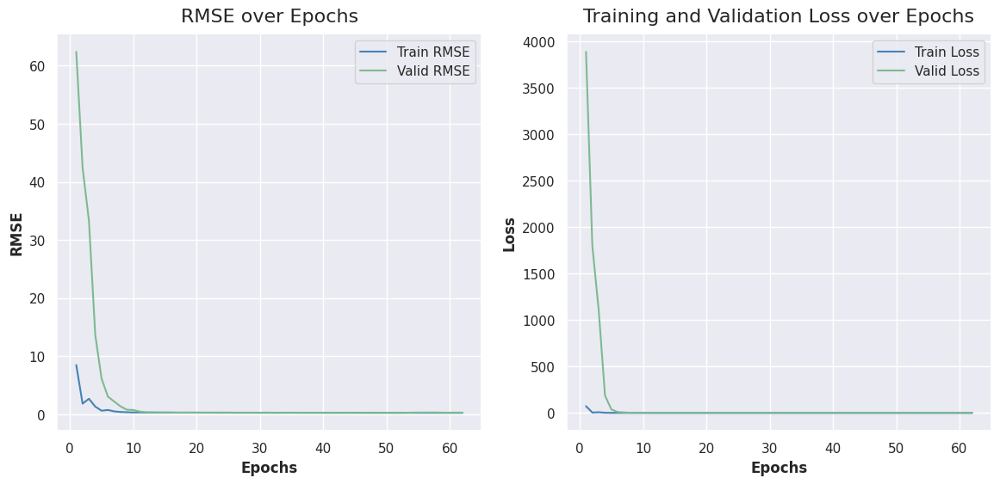

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step - loss: 0.0746 - root_mean_squared_error: 0.2732


[I 2024-11-08 04:04:58,646] Trial 25 finished with value: 0.2707405388355255 and parameters: {'n_hidden_neurons_1': 1195, 'n_hidden_neurons_2': 180, 'dropout_rate': 0.13417332822775527, 'learning_rate': 0.01}. Best is trial 20 with value: 0.2648085355758667.


Epoch 1/2000
7/7 - 12s - 2s/step - loss: 121.0435 - root_mean_squared_error: 11.0020 - val_loss: 19551.5684 - val_root_mean_squared_error: 139.8269 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 1s - 133ms/step - loss: 8.6159 - root_mean_squared_error: 2.9353 - val_loss: 4567.3652 - val_root_mean_squared_error: 67.5823 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 40ms/step - loss: 26.8673 - root_mean_squared_error: 5.1834 - val_loss: 801.4618 - val_root_mean_squared_error: 28.3101 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 41ms/step - loss: 4.5589 - root_mean_squared_error: 2.1352 - val_loss: 27.4006 - val_root_mean_squared_error: 5.2346 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 31ms/step - loss: 3.0110 - root_mean_squared_error: 1.7352 - val_loss: 75.6137 - val_root_mean_squared_error: 8.6956 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 31ms/step - loss: 2.6862 - root_mean_squared_error: 1.6390 - val_loss: 3.6017 - val_root_mean_squared_error: 1.8978 - learning_rate: 0.01

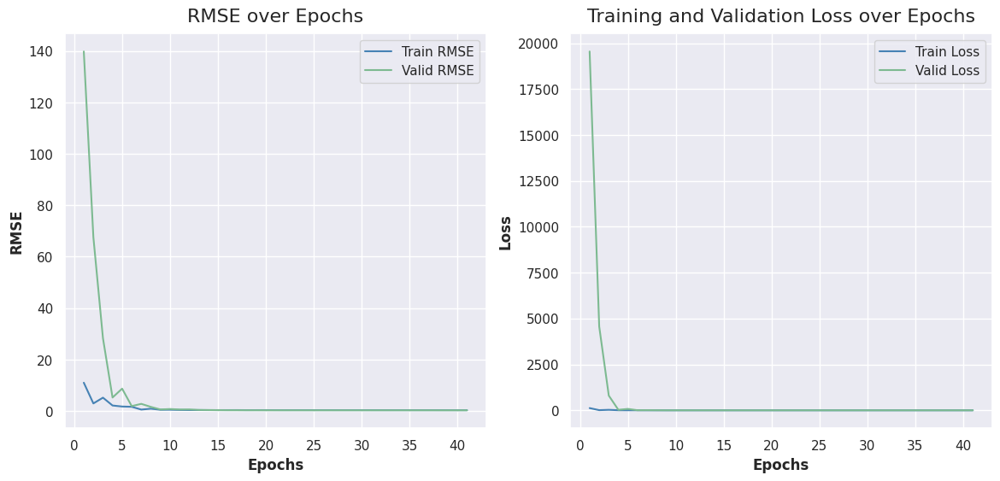

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.0729 - root_mean_squared_error: 0.2700


[I 2024-11-08 04:05:25,691] Trial 26 finished with value: 0.2671905755996704 and parameters: {'n_hidden_neurons_1': 1723, 'n_hidden_neurons_2': 297, 'dropout_rate': 0.1709859020252907, 'learning_rate': 0.01}. Best is trial 20 with value: 0.2648085355758667.


Epoch 1/2000
7/7 - 7s - 966ms/step - loss: 127.2421 - root_mean_squared_error: 11.2802 - val_loss: 5742.2749 - val_root_mean_squared_error: 75.7778 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 5s - 742ms/step - loss: 17.4508 - root_mean_squared_error: 4.1774 - val_loss: 11331.5459 - val_root_mean_squared_error: 106.4497 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 45ms/step - loss: 27.8560 - root_mean_squared_error: 5.2779 - val_loss: 602.5108 - val_root_mean_squared_error: 24.5461 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 45ms/step - loss: 1.9296 - root_mean_squared_error: 1.3891 - val_loss: 189.6707 - val_root_mean_squared_error: 13.7721 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 37ms/step - loss: 5.8106 - root_mean_squared_error: 2.4105 - val_loss: 46.3581 - val_root_mean_squared_error: 6.8087 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 41ms/step - loss: 0.8296 - root_mean_squared_error: 0.9108 - val_loss: 11.5286 - val_root_mean_squared_error: 3.3954 - learning_rate

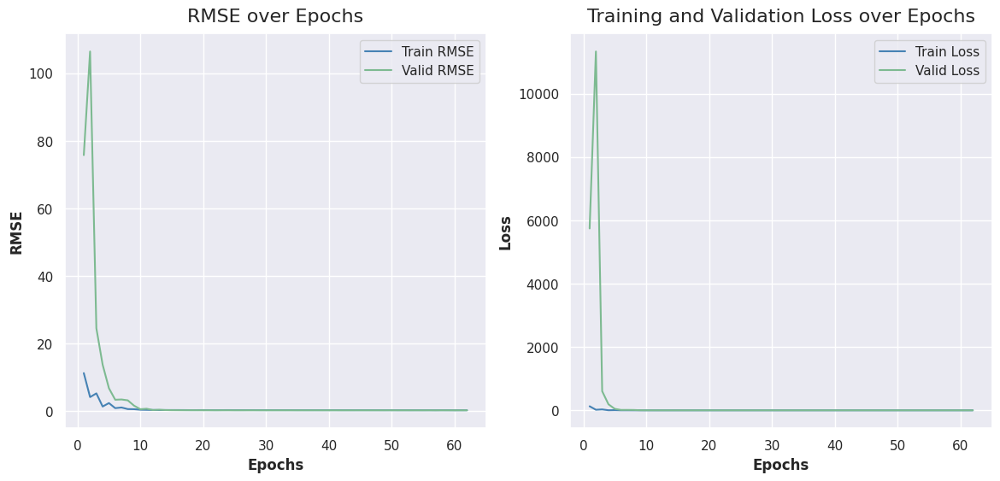

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0708 - root_mean_squared_error: 0.2661


[I 2024-11-08 04:05:51,079] Trial 27 finished with value: 0.2692885100841522 and parameters: {'n_hidden_neurons_1': 1441, 'n_hidden_neurons_2': 417, 'dropout_rate': 0.15166291294124765, 'learning_rate': 0.01}. Best is trial 20 with value: 0.2648085355758667.


Epoch 1/2000
7/7 - 7s - 1s/step - loss: 62.3584 - root_mean_squared_error: 7.8967 - val_loss: 4630.8423 - val_root_mean_squared_error: 68.0503 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 0s - 20ms/step - loss: 2.5911 - root_mean_squared_error: 1.6097 - val_loss: 782.2149 - val_root_mean_squared_error: 27.9681 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 43ms/step - loss: 4.6676 - root_mean_squared_error: 2.1605 - val_loss: 242.7336 - val_root_mean_squared_error: 15.5799 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 20ms/step - loss: 1.5857 - root_mean_squared_error: 1.2593 - val_loss: 151.6673 - val_root_mean_squared_error: 12.3153 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 21ms/step - loss: 0.4055 - root_mean_squared_error: 0.6368 - val_loss: 56.0366 - val_root_mean_squared_error: 7.4858 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 20ms/step - loss: 0.3472 - root_mean_squared_error: 0.5892 - val_loss: 2.4332 - val_root_mean_squared_error: 1.5599 - learning_rate: 0.0100
Epo

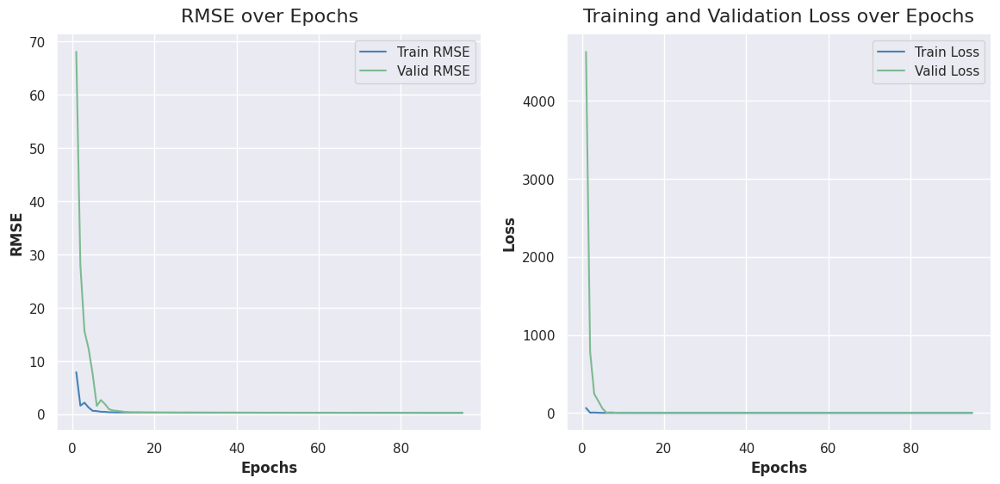

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0725 - root_mean_squared_error: 0.2693


[I 2024-11-08 04:06:22,507] Trial 28 finished with value: 0.26762765645980835 and parameters: {'n_hidden_neurons_1': 1759, 'n_hidden_neurons_2': 163, 'dropout_rate': 0.18336783910191146, 'learning_rate': 0.01}. Best is trial 20 with value: 0.2648085355758667.


Epoch 1/2000
7/7 - 8s - 1s/step - loss: 188.1273 - root_mean_squared_error: 13.7159 - val_loss: 3655.7109 - val_root_mean_squared_error: 60.4625 - learning_rate: 0.0100
Epoch 2/2000
7/7 - 4s - 617ms/step - loss: 35.0675 - root_mean_squared_error: 5.9218 - val_loss: 18267.9844 - val_root_mean_squared_error: 135.1591 - learning_rate: 0.0100
Epoch 3/2000
7/7 - 0s - 21ms/step - loss: 34.8335 - root_mean_squared_error: 5.9020 - val_loss: 949.7410 - val_root_mean_squared_error: 30.8179 - learning_rate: 0.0100
Epoch 4/2000
7/7 - 0s - 42ms/step - loss: 6.2975 - root_mean_squared_error: 2.5095 - val_loss: 965.3304 - val_root_mean_squared_error: 31.0698 - learning_rate: 0.0100
Epoch 5/2000
7/7 - 0s - 43ms/step - loss: 8.4144 - root_mean_squared_error: 2.9008 - val_loss: 94.2106 - val_root_mean_squared_error: 9.7062 - learning_rate: 0.0100
Epoch 6/2000
7/7 - 0s - 37ms/step - loss: 1.0808 - root_mean_squared_error: 1.0396 - val_loss: 144.0290 - val_root_mean_squared_error: 12.0012 - learning_rate:

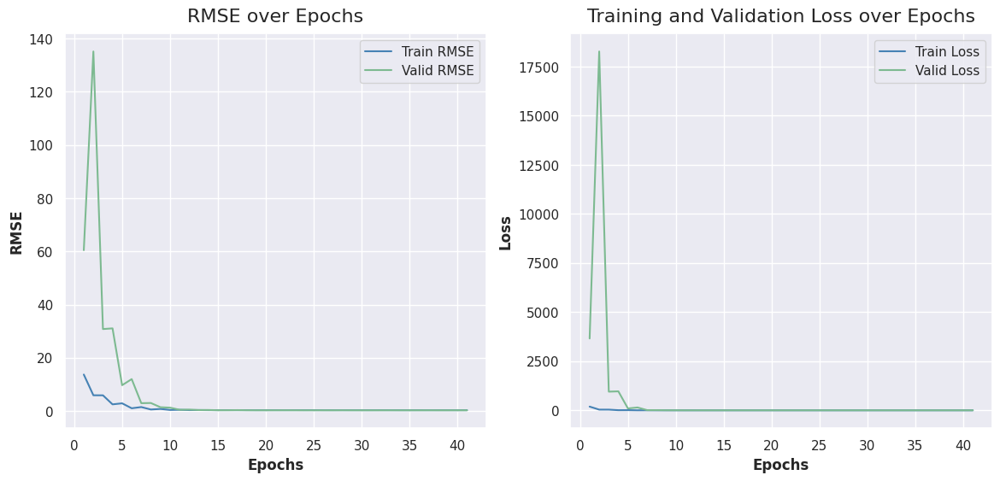

26/26 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0764 - root_mean_squared_error: 0.2763


[I 2024-11-08 04:06:50,563] Trial 29 finished with value: 0.27406349778175354 and parameters: {'n_hidden_neurons_1': 1588, 'n_hidden_neurons_2': 525, 'dropout_rate': 0.12269315702593553, 'learning_rate': 0.01}. Best is trial 20 with value: 0.2648085355758667.


In [ ]:
# создадим объект study
study_nn = optuna.create_study(direction="minimize", sampler=optuna.samplers.TPESampler(seed=10))

# запустим процесс оптимизации
study_nn.optimize(objective_nn, n_trials=30)

In [ ]:
# получим лучшие параметры
n_hidden_neurons_1 = study_nn.best_params['n_hidden_neurons_1']
n_hidden_neurons_2 = study_nn.best_params['n_hidden_neurons_2']
dropout_rate = study_nn.best_params['dropout_rate']
learning_rate = study_nn.best_params['learning_rate']

# Создадим модель
tuned_model_nn = Sequential([
    Dense(n_hidden_neurons_1, input_shape=(X_train_scaled.shape[1],), activation='elu'),
    BatchNormalization(),
    Dropout(dropout_rate),

    Dense(n_hidden_neurons_2, activation='elu'),
    BatchNormalization(),
    Dropout(dropout_rate),

    Dense(1)  # Последний слой для регрессии
])

# определим раннюю остановку
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=20,
                               restore_best_weights=True)

# Компилируем модель
tuned_model_nn.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')

# Обучаем модель на масштабированных данных
tuned_model_nn.fit(
    X_train_scaled,
    y_train,
    epochs=5000,
    batch_size=512,
    validation_data=(X_valid_scaled, y_valid),
    callbacks=[early_stopping],
)

# получим предсказания на валидационной выборке
preds_nn = tuned_model_nn.predict(X_valid_scaled)

Epoch 1/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 431ms/step - loss: 53.2957 - val_loss: 496.7006
Epoch 2/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 4.8256 - val_loss: 404.5114
Epoch 3/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 7.2995 - val_loss: 137.2426
Epoch 4/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 3.0489 - val_loss: 7.2729
Epoch 5/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.6286 - val_loss: 20.8495
Epoch 6/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 1.1048 - val_loss: 2.2743
Epoch 7/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 0.1767 - val_loss: 0.9350
Epoch 8/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3074 - val_loss: 0.4020
Epoch 9/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1635 - val_loss: 0.2123
Epoch 10/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.1474 - val_loss: 0.2114
Epoch 11/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 0.1309 - val_loss: 0.0842
Epoch 12/5000
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - 

In [ ]:
# метрики модели
scores_nn = study_nn.best_value
scores_nn_scaled = mean_squared_error(y_valid, preds_nn, squared=False)

# выведем метрики лучшей модели
print('RMSE на валидационной выборке:')
print(scores_nn)

print('RMSE на валидационной выборке с масштабированием:')
scores_nn_scaled

RMSE на валидационной выборке:
0.2648085355758667
RMSE на валидационной выборке с масштабированием:


0.251856659585036

**Вывод**
    
Получены лучшие параметрыполносвязной нейронной сети.

- RMSE на валидационной выборке: **0.265**
- RMSE на валидационной выборке с масштабированием:  **0.252**

## Выбор лучшей модели
    
Для удобства соберём полученные метрики моделей в сравнительную таблицу.

In [ ]:
results = pd.DataFrame(
    {'Модели': ['Ridge', 'LinearSVR', 'NeuralNetwork'],
     'RMSE на valid': [scores_ridge, scores_SVR, scores_nn],
     'RMSE на valid scaled': [scores_ridge_scaled, scores_SVR_scaled, scores_nn_scaled]
    })

results

,Модели,RMSE на valid,RMSE на valid scaled
0,Ridge,0.288,0.266
1,LinearSVR,0.276,0.277
2,NeuralNetwork,0.265,0.252


Для получения прогноза выберем модель **нейронной сети**.

Модель показала оптимальное соотношение скорости обучения и качества прогноза:

*   метрика **RMSE** модели на валидационной выборке - **0.265**;
*   метрика **RMSE** модели на валидационной выборке с масштабированием - **0.252** .

## Тестирование модели
Для проведения тестирования получим эмбеддинги всех тестовых изображений.

In [ ]:
# подготовим загрузчик данных с паддингом
def load_test(path=PATH_REMOTE_FOLDER) -> ImageDataGenerator:
    test_datagen = ImageDataGenerator(
        preprocessing_function=preprocess_input,
        fill_mode='constant',  # добавим паддинг
        cval=0
    )

    # создадим генератор данных с сохранением пропорций
    test_gen_flow = test_datagen.flow_from_dataframe(
        dataframe=test_images,
        directory=Path(path, 'test_images'),
        x_col='image',
        y_col=None,
        target_size=(224, 224),  # размер, на котором обучалась ResNet
        batch_size=16,
        class_mode='input',
        seed=SEED,
        shuffle=False  # порядок изображений сохранён
    )

    return test_gen_flow

In [ ]:
# получим эмбеддинги изображений
test_image_embeddings = vectorize_pictures(create_model(), load_test())

Found 100 validated image filenames.
7/7 ━━━━━━━━━━━━━━━━━━━━ 29s 4s/step


In [ ]:
print(
    'Размерность исходных данных: ',
    test_images.shape,
    '\n',
    'Размерность эмбеддингов изображений: ',
    test_image_embeddings.shape
    )

Размерность исходных данных:  (100, 1) 
 Размерность эмбеддингов изображений:  (100, 2048)


Напишем функцию, которая:
*   принимает  на вход текстовое описание;
*   векторизирует описание;
*  возвращает изображение с максимальной оценкой схожести.

In [ ]:
def get_picture(text) -> None:
    # проверим запрос на соответствие законодательству
    if [i for i in clean_text(text) if i in stop_list]:
        print('')
        print('— ', text)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        # получим эмбеддинг текста
        test_text_embeddings = vectorize_text(model=BERT, data=[text], bar=False)

        # объединим эмбеддинг текста с эмбеддингами картинок
        X = np.concatenate((
            test_image_embeddings,
            np.resize(test_text_embeddings, (test_image_embeddings.shape[0], 768))),
            axis=1)

        # масштабируем тестовые эмбеддинги
        X_scaled = scaler.transform(X)

        # получим предсказания оценки соответствия
        predictions = tuned_model_nn.predict(X_scaled)

        # объединим предсказания и изображения
        test_set = pd.concat((test_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='predictions')), axis=1)

        # получим лучшее соответствие
        best_pics = list(test_set.sort_values(by='predictions', ascending=False)['image'].head(1))
        best_score = np.max(predictions)

        print('')
        print('— ', text)
        print('Best match score:', best_score)
        print('')

         # выведем лучшее изображение, найденное моделью
        best_image_path = Path(PATH_REMOTE_FOLDER, "test_images", best_pics[0])
        img = Image.open(best_image_path)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

In [ ]:
# получим 10 случайных запросов
samples = test_queries.sample(10, random_state=SEED)
text_test = list(samples['query_text'])
text_test

['A group of girls who are gothically dressed standing together',
 'A woman and girl riding downhill on a sled with a dog running alongside them',
 'The dog is running .',
 'A group of people are ice skating in a big city .',
 'Little kid in blue coat and hat riding a tricycle .',
 'Two black dogs fighting over an orange toy .',
 'A dog jumping for a tennis ball near an ocean',
 'Boy flying a distant kite .',
 'kids play ultimate Frisbee .',
 'A girl in a purple shirt feeding ducks']


—  A group of girls who are gothically dressed standing together

This image is unavailable in your country in compliance with local laws.


—  A woman and girl riding downhill on a sled with a dog running alongside them

This image is unavailable in your country in compliance with local laws.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

—  The dog is running .
Best match score: 0.78831494



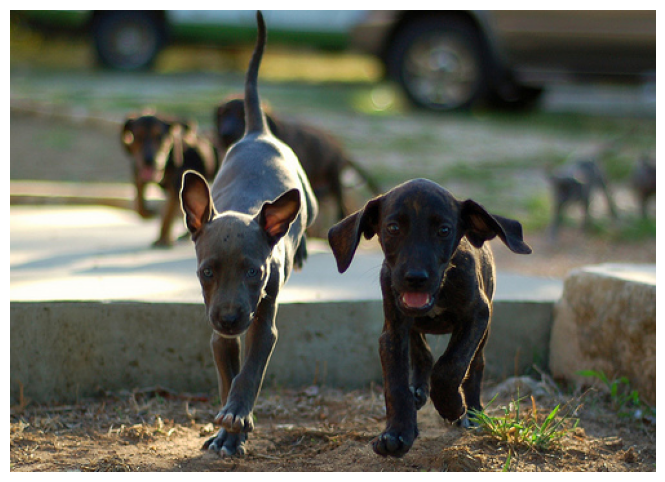

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

—  A group of people are ice skating in a big city .
Best match score: 0.47063816



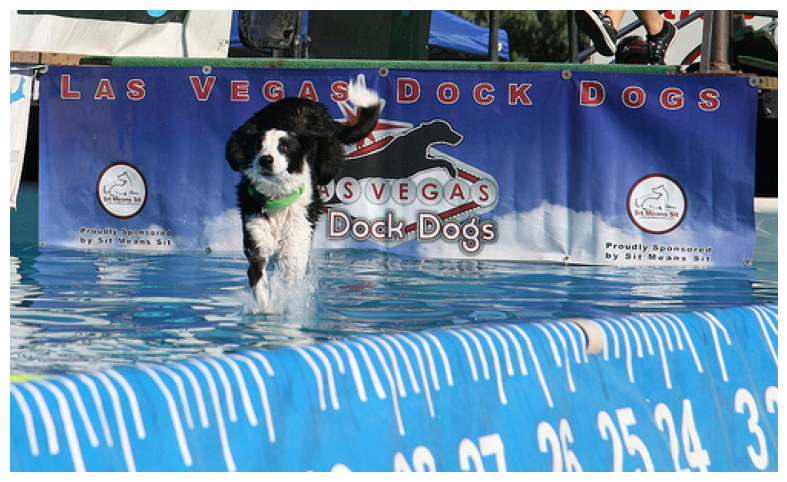


—  Little kid in blue coat and hat riding a tricycle .

This image is unavailable in your country in compliance with local laws.

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

—  Two black dogs fighting over an orange toy .
Best match score: 0.61438227



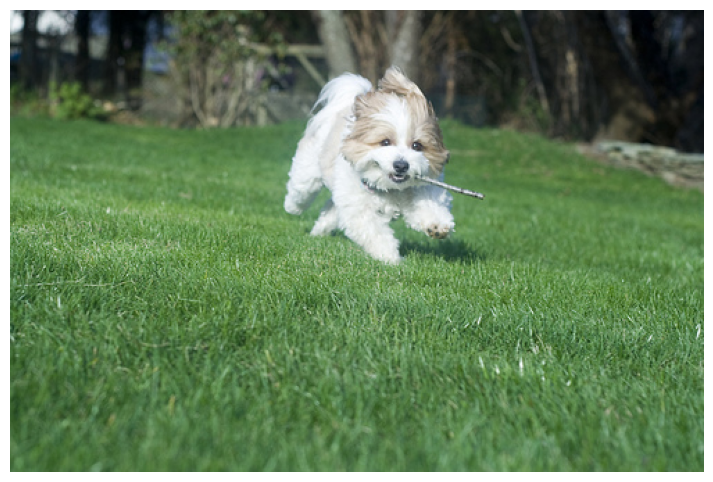

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

—  A dog jumping for a tennis ball near an ocean
Best match score: 0.60299927



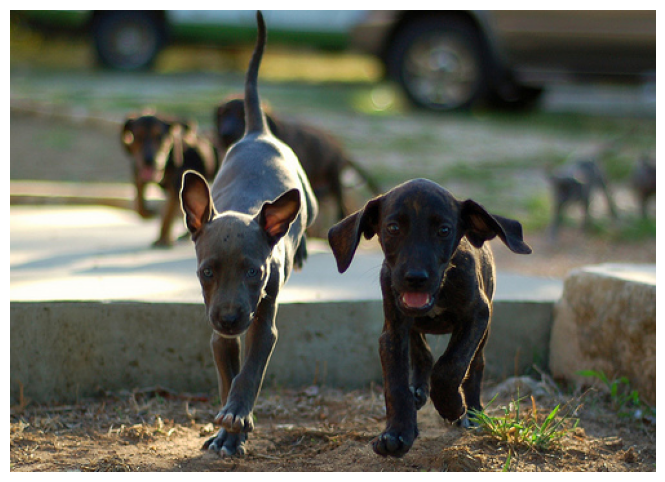


—  Boy flying a distant kite .

This image is unavailable in your country in compliance with local laws.


—  kids play ultimate Frisbee .

This image is unavailable in your country in compliance with local laws.


—  A girl in a purple shirt feeding ducks

This image is unavailable in your country in compliance with local laws.



In [ ]:
# получим изображения, соответствующие запросам
for text in text_test:
    get_picture(text)

## Альтернативное решение

Воспользуемся библиотекой `sentence-transformers` с `clip-ViT-B-32`.

In [ ]:
# загрузим предобученную модель
model = SentenceTransformer('clip-ViT-B-32')

modules.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/1.91k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

0_CLIPModel/config.json:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

0_CLIPModel/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

0_CLIPModel/special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

0_CLIPModel/vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

0_CLIPModel/preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

0_CLIPModel/tokenizer_config.json:   0%|          | 0.00/604 [00:00<?, ?B/s]

In [ ]:
# получим пути к изображениям
images = list(glob.glob(str(Path(PATH_REMOTE_FOLDER, 'test_images', '*.jpg'))))

# создадим эмбеддинги
img_emb = model.encode(
    [Image.open(filepath) for filepath in images],
    batch_size=16,
    convert_to_tensor=True,
    show_progress_bar=True
)

Batches:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
def search(query) -> None:
    # проверим запрос на соответствие законодательству
    if [i for i in clean_text(query) if i in stop_list]:
        print('')
        print('— ', query)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        # получим эмбеддинг запроса
        query_emb = model.encode([query], convert_to_tensor=True, show_progress_bar=False)

        # получим изображение с наивысшей оценкой
        best_match = util.semantic_search(query_emb, img_emb, top_k=1)[0][0]

        # получим путь к лучшему совпадению и его оценку
        best_image_path = images[best_match['corpus_id']]
        best_score = round(best_match['score'], 2)


        print('')
        print('— ', query)
        print('Best match score:', best_score)
        print('')

        # выведем найденное лучшее изображение
        fig, ax = plt.subplots(figsize=(6, 6))
        img = Image.open(best_image_path)
        ax.imshow(img)
        ax.axis('off')
        plt.show()

    return None

In [ ]:
# получим 5 случайных запросов
samples = test_queries.sample(5, random_state=12345)
queries = list(samples['query_text'])
queries

['A dog is wearing jeans and a blue and yellow shirt with a black vehicle in the background .',
 'While holding tight to the ball , the man in red socks is getting tackled .',
 'A dog is dressed in a shirt and pants on the side of the road .',
 'a biker rides down the street .',
 'a kickboxer jumping for a kick']


—  A dog is wearing jeans and a blue and yellow shirt with a black vehicle in the background .
Best match score: 0.34



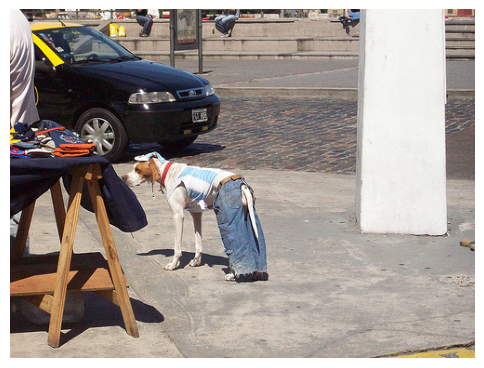


—  While holding tight to the ball , the man in red socks is getting tackled .
Best match score: 0.27



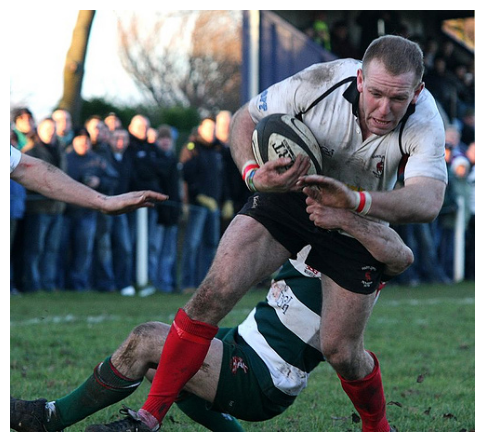


—  A dog is dressed in a shirt and pants on the side of the road .
Best match score: 0.32



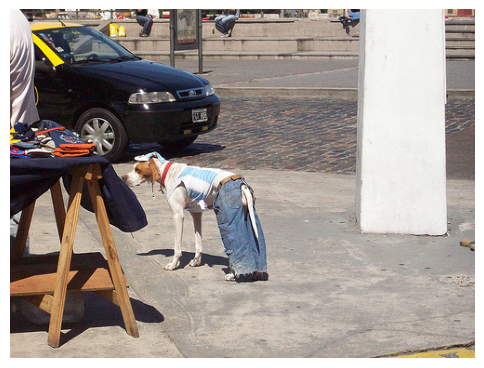


—  a biker rides down the street .
Best match score: 0.27



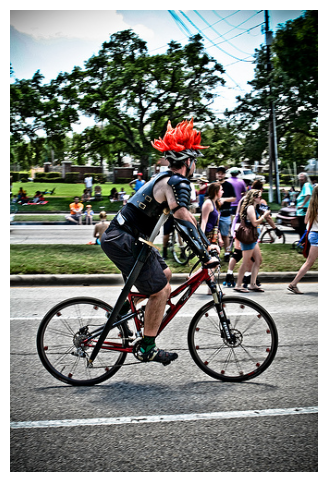


—  a kickboxer jumping for a kick
Best match score: 0.32



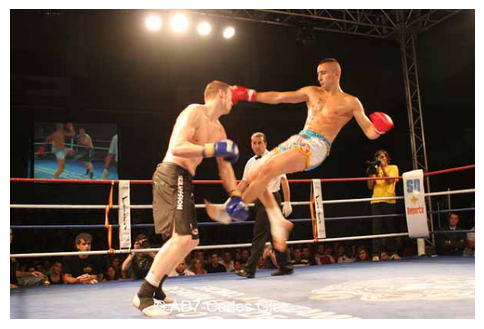

In [ ]:
# получим изображения, соответствующие запросам
for query in queries:
    search(query)

**Вывод:**

Целью данного исследования являлась разработка модели для сочетания изображений и текстовых описаний с целью поиска изображений по текстовым запросам.

Результаты исследования можно признать неудовлетворительными: модель нередко определяет только частичные совпадения, либо выбирает ошибочные изображения как соответствующие описанию.

Практическая реализация поиска изображений по текстовым запросам может иметь широкое применение, при этом для эффективной работы потребуется дальнейшая доработка качества предсказаний модели.

**Рекомендации по улучшению:**

1. Увеличение размера тренировочного набора данных: увеличение количества примеров может помочь модели лучше изучить пары изображение-описание и находить их соответствия с более высокой точностью.

2. Доработка текстовых запросов: более подробные и понятные описания могут помочь улучшить точность оценки соответствия как людьми, так и экспертами. Более точная оценка в свою очередь поможет улучшить качество работы модели.

4. Улучшение архитектуры модели: стоит также рассмотреть более сложные архитектуры нейронных сетей, способные лучше сопоставлять текстовые запросы с изображениями.

Данные рекомендации позволят создать более точную систему поиска изображений по текстовым запросам.

## Общий вывод

> **Исследовательский анализ**
    
- Проведён анализ экспертных и краудсорсинговых оценок соответствия.
- Выполнена агрегация оценок соответствия, из чего получен целевой признак.

> **Проверка данных**

- Выполнена очистка обучающих данных от запрещённого контента.

> **Векторизация изображений**

-  векторизации изображений выполнена с использованием сети `ResNet50`.

> **Векторизация текстов**

- текстовые эмбеддинги получены с помощью модели `BERT - base cased EN`.

> **Объединение векторов**

- подготовлены данные для обучения: векторы изображений и текстов объединены с целевой переменной.

> **Обучение модели предсказания соответствия**

Для целей исследования написаны три модели на следующих алгоритмах:
  - RidgeRegression
  - LinearSVR
  - трёхслойная нейронная сеть

Для получения прогноза выбрана модель нейронной сети.

Модель показала оптимальное соотношение скорости обучения и качества прогноза:

- метрика RMSE модели на валидационной выборке - 0.265;
- метрика RMSE модели на валидационной выборке с масштабированием - 0.252 .

> **Тестирование модели**

Для тестирования модели написана функция, которая возвращает наиболее релевантное изображение для каждого текстового запроса.   

Для теста выбраны случайные 10 запросов, качество поиска оценено визуально.

---

**Заключение:**

Целью данного исследования являлась разработка модели для сочетания изображений и текстовых описаний с целью поиска изображений по текстовым запросам.

Результаты исследования можно признать неудовлетворительными: модель нередко определяет только частичные совпадения, либо выбирает ошибочные изображения как соответствующие описанию.

Практическая реализация поиска изображений по текстовым запросам может иметь широкое применение, при этом для эффективной работы потребуется дальнейшая доработка качества предсказаний модели.

**Рекомендации по улучшению:**

1. Увеличение размера тренировочного набора данных: увеличение количества примеров может помочь модели лучше изучить пары изображение-описание и находить их соответствия с более высокой точностью.

2. Доработка текстовых запросов: более подробные и понятные описания могут помочь улучшить точность оценки соответствия как людьми, так и экспертами. Более точная оценка в свою очередь поможет улучшить качество работы модели.

4. Улучшение архитектуры модели: стоит также рассмотреть более сложные архитектуры нейронных сетей, способные лучше сопоставлять текстовые запросы с изображениями.

Данные рекомендации позволят создать более точную систему поиска изображений по текстовым запросам.